Let's import all the necessary packages required for eda, model selection and prediction

In [40]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import scipy
from sklearn import *
import statsmodels.api as sm
import networkx as nx
import requests
from flask import Flask
import sqlalchemy
import pytest
import tkinter as tk
import openpyxl

Since it was creating parser errors while i was opening the file, i decided to handle the parser error by first importing StringIO from io and then used try and and except clause while implementing if and else loop for server response status code. 

In [41]:
from io import StringIO
winequalitycsv_url = 'https://raw.githubusercontent.com/dsrscientist/DSData/master/winequality-red.csv'
winequalitydata = pd.DataFrame()
try:
    response = requests.get(winequalitycsv_url)
    if response.status_code == 200:
        winequalitycsv_data = response.text
        winequalitycsv_buffer = StringIO(winequalitycsv_data)
        
      
        winequalitydata = pd.read_csv(winequalitycsv_buffer)
    else:
        print(f"HTTP GET request failed {response.status_code}")
except Exception as e:
    print(f"error: {e}")


Now lets open the dataframe in which the csv file was saved earlier

In [42]:
winequalitydata

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4,5
1,7.8,0.880,0.00,2.6,0.098,25.0,67.0,0.99680,3.20,0.68,9.8,5
2,7.8,0.760,0.04,2.3,0.092,15.0,54.0,0.99700,3.26,0.65,9.8,5
3,11.2,0.280,0.56,1.9,0.075,17.0,60.0,0.99800,3.16,0.58,9.8,6
4,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4,5
...,...,...,...,...,...,...,...,...,...,...,...,...
1594,6.2,0.600,0.08,2.0,0.090,32.0,44.0,0.99490,3.45,0.58,10.5,5
1595,5.9,0.550,0.10,2.2,0.062,39.0,51.0,0.99512,3.52,0.76,11.2,6
1596,6.3,0.510,0.13,2.3,0.076,29.0,40.0,0.99574,3.42,0.75,11.0,6
1597,5.9,0.645,0.12,2.0,0.075,32.0,44.0,0.99547,3.57,0.71,10.2,5


In [37]:
winequalitydata.head(30)

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5
1,7.8,0.880,0.00,2.6,0.098,25.0,67.0,0.9968,3.20,0.68,9.8,5
2,7.8,0.760,0.04,2.3,0.092,15.0,54.0,0.9970,3.26,0.65,9.8,5
3,11.2,0.280,0.56,1.9,0.075,17.0,60.0,0.9980,3.16,0.58,9.8,6
4,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5
5,7.4,0.660,0.00,1.8,0.075,13.0,40.0,0.9978,3.51,0.56,9.4,5
6,7.9,0.600,0.06,1.6,0.069,15.0,59.0,0.9964,3.30,0.46,9.4,5
7,7.3,0.650,0.00,1.2,0.065,15.0,21.0,0.9946,3.39,0.47,10.0,7
8,7.8,0.580,0.02,2.0,0.073,9.0,18.0,0.9968,3.36,0.57,9.5,7
9,7.5,0.500,0.36,6.1,0.071,17.0,102.0,0.9978,3.35,0.80,10.5,5


In [38]:
winequalitydata.tail(30)

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
1569,6.2,0.510,0.14,1.9,0.056,15.0,34.0,0.99396,3.48,0.57,11.5,6
1570,6.4,0.360,0.53,2.2,0.230,19.0,35.0,0.99340,3.37,0.93,12.4,6
1571,6.4,0.380,0.14,2.2,0.038,15.0,25.0,0.99514,3.44,0.65,11.1,6
1572,7.3,0.690,0.32,2.2,0.069,35.0,104.0,0.99632,3.33,0.51,9.5,5
1573,6.0,0.580,0.20,2.4,0.075,15.0,50.0,0.99467,3.58,0.67,12.5,6
1574,5.6,0.310,0.78,13.9,0.074,23.0,92.0,0.99677,3.39,0.48,10.5,6
1575,7.5,0.520,0.40,2.2,0.060,12.0,20.0,0.99474,3.26,0.64,11.8,6
1576,8.0,0.300,0.63,1.6,0.081,16.0,29.0,0.99588,3.30,0.78,10.8,6
1577,6.2,0.700,0.15,5.1,0.076,13.0,27.0,0.99622,3.54,0.60,11.9,6
1578,6.8,0.670,0.15,1.8,0.118,13.0,20.0,0.99540,3.42,0.67,11.3,6


The dataset is related to red and white variants of the Portuguese "Vinho Verde" wine. Due to privacy and logistic issues, only physicochemical (inputs) and sensory (the output) variables are available (e.g. there is no data about grape types, wine brand, wine selling price, etc.).

Input variables (based on physicochemical tests):
1 - fixed acidity
2 - volatile acidity
3 - citric acid
4 - residual sugar
5 - chlorides
6 - free sulfur dioxide
7 - total sulfur dioxide
8 - density
9 - pH
10 - sulphates
11 - alcohol
Output variable (based on sensory data):
12 - quality (score between 0 and 10)


Now let's declare the x variables of this winequality dataframe.

In [39]:
winequalityxvariable_data = winequalitydata.iloc[:,:-1]

In [40]:
winequalityxvariable_data

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol
0,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4
1,7.8,0.880,0.00,2.6,0.098,25.0,67.0,0.99680,3.20,0.68,9.8
2,7.8,0.760,0.04,2.3,0.092,15.0,54.0,0.99700,3.26,0.65,9.8
3,11.2,0.280,0.56,1.9,0.075,17.0,60.0,0.99800,3.16,0.58,9.8
4,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4
...,...,...,...,...,...,...,...,...,...,...,...
1594,6.2,0.600,0.08,2.0,0.090,32.0,44.0,0.99490,3.45,0.58,10.5
1595,5.9,0.550,0.10,2.2,0.062,39.0,51.0,0.99512,3.52,0.76,11.2
1596,6.3,0.510,0.13,2.3,0.076,29.0,40.0,0.99574,3.42,0.75,11.0
1597,5.9,0.645,0.12,2.0,0.075,32.0,44.0,0.99547,3.57,0.71,10.2


Now let's declare the target variable which is the output column ='quality'

In [41]:
winequalitytargetvariable_data=winequalitydata.iloc[:,[-1]]

In [42]:
winequalitytargetvariable_data

,quality
0,5
1,5
2,5
3,6
4,5
...,...
1594,5
1595,6
1596,6
1597,5


Now let's count the number of values that belong to each class present in our target variable

In [347]:
winequality_counts = winequalitydata['quality'].value_counts()
print(winequality_counts)

5    681
6    638
7    199
4     53
8     18
3     10
Name: quality, dtype: int64


We can conclude that quality with rating 5 has the highest number of values with 681, and rating 3 has the lowest number of values with 10

Now let's get some description of the dataframe winequalitydata

In [348]:
winequalitydetails = winequalitydata.describe()
print(winequalitydetails)

       fixed acidity  volatile acidity  citric acid  residual sugar  \
count    1599.000000       1599.000000  1599.000000     1599.000000   
mean        8.319637          0.527821     0.270976        2.538806   
std         1.741096          0.179060     0.194801        1.409928   
min         4.600000          0.120000     0.000000        0.900000   
25%         7.100000          0.390000     0.090000        1.900000   
50%         7.900000          0.520000     0.260000        2.200000   
75%         9.200000          0.640000     0.420000        2.600000   
max        15.900000          1.580000     1.000000       15.500000   

         chlorides  free sulfur dioxide  total sulfur dioxide      density  \
count  1599.000000          1599.000000           1599.000000  1599.000000   
mean      0.087467            15.874922             46.467792     0.996747   
std       0.047065            10.460157             32.895324     0.001887   
min       0.012000             1.000000         

The list of data we can intrepret from the description are the following-

1) Median of fixed acidity is(8.319637) is slightly higher than its mean(7.900000), which means very few or neglible outliers are present- -ve skewed
2) Median of volatile acidity(0.520000) is slightly lower than its mean(0.527821), which means very few or neglible outliers are present- +ve
3) Median of citric acid(0.420000) is quite higher than its mean(0.270976), which means some outliers are present- -ve 
4) Median of residual sugar(2.200000) is slightly lower than its mean(2.538806), which means very few or neglible outliers are present- +ve
5) Median of chlorides is slightly(0.079000) lower than its mean(0.087467), which means very few or neglible outliers are present- +ve
6) Median of free sulfur dioxide(14.000000) is quite lower than its mean(15.874922), which means few outliers are present- +ve
7) Median of total sulfur dioxide(38.000000) is pretty lower than its mean(46.467792), which means a lot of outliers are present- +ve
8) Median of density(0.996750) is slightly higher than its mean(0.996747), which means ery few or neglible outliers are present- -ve
9) Median of sulphates(0.620000) is slightly lower than its mean(0.658149), which means very few or neglible outliers are present- +ve
10) Median of  pH(3.310000) is sightly lower than its mean(3.311113), which means very few or neglible outliers are present- +ve
11) Median of alcohol(10.200000) is slightly lower than its mean(10.422983), which means very few or neglible outliers are present- +ve
12) Median of sulphates(0.620000) is slightly lower than its mean(0.658149), which means very few or neglible outliers are present- +ve
13) Median of sulphates(6.000000) is slightly higher than its mean(5.636023), which means few outliers are present- -ve
14) The count of all columns are the same

Now let's get some info out of the dataset

In [349]:
winequalityinfo = winequalitydata.info
print(winequalityinfo)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1599 entries, 0 to 1598
Data columns (total 12 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   fixed acidity         1599 non-null   float64
 1   volatile acidity      1599 non-null   float64
 2   citric acid           1599 non-null   float64
 3   residual sugar        1599 non-null   float64
 4   chlorides             1599 non-null   float64
 5   free sulfur dioxide   1599 non-null   float64
 6   total sulfur dioxide  1599 non-null   float64
 7   density               1599 non-null   float64
 8   pH                    1599 non-null   float64
 9   sulphates             1599 non-null   float64
 10  alcohol               1599 non-null   float64
 11  quality               1599 non-null   int64  
dtypes: float64(11), int64(1)
memory usage: 150.0 KB
None


The list of data we can intrepret from the description are the following-
1) float64(11), int64(1)

Now let's get the absolute value for the entire dataset

In [350]:
absolute_df = winequalitydata.abs()
print(absolute_df)

      fixed acidity  volatile acidity  citric acid  residual sugar  chlorides  \
0               7.4             0.700         0.00             1.9      0.076   
1               7.8             0.880         0.00             2.6      0.098   
2               7.8             0.760         0.04             2.3      0.092   
3              11.2             0.280         0.56             1.9      0.075   
4               7.4             0.700         0.00             1.9      0.076   
...             ...               ...          ...             ...        ...   
1594            6.2             0.600         0.08             2.0      0.090   
1595            5.9             0.550         0.10             2.2      0.062   
1596            6.3             0.510         0.13             2.3      0.076   
1597            5.9             0.645         0.12             2.0      0.075   
1598            6.0             0.310         0.47             3.6      0.067   

      free sulfur dioxide  

Now let's get the size of the entire dataset

In [351]:
winequalitydata.shape

(1599, 12)

In [352]:
winequalitydata.columns

Index(['fixed acidity', 'volatile acidity', 'citric acid', 'residual sugar',
       'chlorides', 'free sulfur dioxide', 'total sulfur dioxide', 'density',
       'pH', 'sulphates', 'alcohol', 'quality'],
      dtype='object')

Now let's get the number of null values and heatmap of it

In [353]:
winequalitydata.isnull().sum().sum()

0

<Axes: >

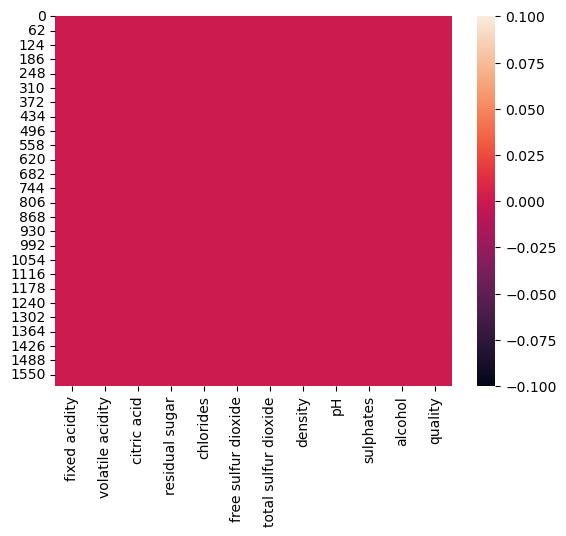

In [354]:
sns.heatmap(winequalitydata.isnull())

Now let's find unique values from our target variable

In [355]:
winequalitydata['quality'].unique()

array([5, 6, 7, 4, 8, 3], dtype=int64)

In [356]:
winequalitydata['quality'].nunique()

6

Now let's find value counts for each of the values in each of the column

In [357]:
for i in winequalitydata.columns:
    print(winequalitydata[i].value_counts())
    print("/n")

7.2     67
7.1     57
7.8     53
7.5     52
7.0     50
        ..
13.5     1
13.8     1
13.4     1
4.7      1
5.5      1
Name: fixed acidity, Length: 96, dtype: int64
/n
0.600    47
0.500    46
0.430    43
0.590    39
0.360    38
         ..
1.035     1
0.565     1
1.130     1
1.115     1
1.090     1
Name: volatile acidity, Length: 143, dtype: int64
/n
0.00    132
0.49     68
0.24     51
0.02     50
0.26     38
       ... 
0.72      1
0.62      1
0.75      1
1.00      1
0.78      1
Name: citric acid, Length: 80, dtype: int64
/n
2.00     156
2.20     131
1.80     129
2.10     128
1.90     117
        ... 
4.25       1
2.85       1
3.45       1
2.35       1
13.90      1
Name: residual sugar, Length: 91, dtype: int64
/n
0.080    66
0.074    55
0.076    51
0.078    51
0.084    49
         ..
0.108     1
0.148     1
0.143     1
0.222     1
0.230     1
Name: chlorides, Length: 153, dtype: int64
/n
6.0     138
5.0     104
10.0     79
15.0     78
12.0     75
7.0      71
9.0      62
16.0     61

The data we found based on our target variable is as follows-

5 -   681,
6 -   638,
7 -   199,
4  -   53,
8  -   18,
3  -   10,


In [358]:
winequalitydata.shape[0]

1599

Let's understand the datatypes of our x variables/independent variables and target variables

In [359]:
winequalitydata.dtypes

fixed acidity           float64
volatile acidity        float64
citric acid             float64
residual sugar          float64
chlorides               float64
free sulfur dioxide     float64
total sulfur dioxide    float64
density                 float64
pH                      float64
sulphates               float64
alcohol                 float64
quality                   int64
dtype: object

Since only our target variable is int64, and the x variables are float64, we can now move on to segment the data into winequalitydata x variables = columns and winqualitydata y variables

In [43]:
winecategory_col=[]
for i in winequalitydata.dtypes.index:
    if winequalitydata.dtypes[i] == 'float64':
        winecategory_col.append(i)
print("winecateogry columns:", winecategory_col)
print("/n")

winecateogry columns: ['fixed acidity', 'volatile acidity', 'citric acid', 'residual sugar', 'chlorides', 'free sulfur dioxide', 'total sulfur dioxide', 'density', 'pH', 'sulphates', 'alcohol']
/n


In [ ]:
winequalitydata y variables

In [44]:
winecategory_col=[]
for i in winequalitydata.dtypes.index:
    if winequalitydata.dtypes[i] != 'float64':
        winecategory_col.append(i)
print("winecateogry columns:", winecategory_col)
print("/n")

winecateogry columns: ['quality']
/n


In [362]:
winenumerical_col=[]
for i in winequalitydata.dtypes.index:
    if winequalitydata.dtypes[i] == 'int64':
        winenumerical_col.append(i)
print("winenumerical columns:", winenumerical_col)
print("/n")

winenumerical columns: ['quality']
/n


Let's find the location and sum of null values if any in the dataframe

In [363]:
winequalitydata.loc[winequalitydata["quality"]==""]

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality


In [365]:
winequalitydata.isnull().sum()

fixed acidity           0
volatile acidity        0
citric acid             0
residual sugar          0
chlorides               0
free sulfur dioxide     0
total sulfur dioxide    0
density                 0
pH                      0
sulphates               0
alcohol                 0
quality                 0
dtype: int64

Now let's find the mean of our target variable/y variable= quality

In [364]:
print(winequalitydata["quality"].mean())

5.6360225140712945


In [368]:
winequalitydata['quality'].value_counts()

5    681
6    638
7    199
4     53
8     18
3     10
Name: quality, dtype: int64

This confirms our previous counts of most wines falling into the quality level 5 and 6.

Now let's find how many unique values exists for each column in the dataset.

In [367]:
winequalitydata.nunique().to_frame("No. of Unique values")

,No. of Unique values
fixed acidity,96
volatile acidity,143
citric acid,80
residual sugar,91
chlorides,153
free sulfur dioxide,60
total sulfur dioxide,144
density,436
pH,89
sulphates,96


Let's confirm the maximum quality and the minimum quality in our dataset

In [369]:
print("max quality:",winequalitydata["quality"].max())
print("min quality:",winequalitydata["quality"].min())

max quality: 8
min quality: 3


Let's check for duplicate rows although they won't make an impact in our classification task since we need to classify and there are possibilities that many wine with same qualities may same values, and we were not provided with labels of different wines in order to delete them. 

In [370]:
print("Total duplicated rows:", winequalitydata.duplicated().sum())

Total duplicated rows: 240


End of EDA phase-1

Let's visualise the datasets using different plots available in seaborn and matplot.lib

Let's begin with countplot of our target variable quality to assure the distribution based on concuring of the mean.

5    681
6    638
7    199
4     53
8     18
3     10
Name: quality, dtype: int64


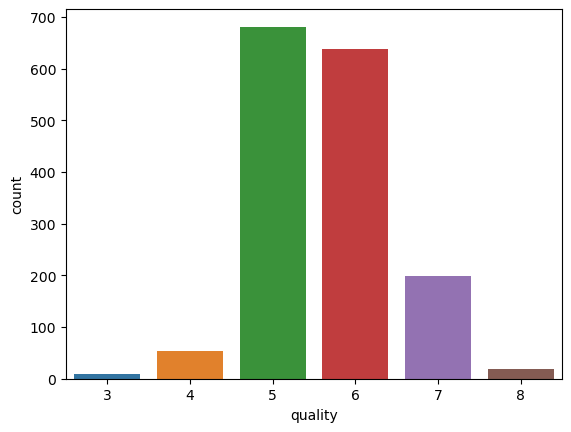

In [371]:
wc=sns.countplot(x='quality',data=winequalitydata)
print(winequalitydata['quality'].value_counts())

Now let's do the same for our columns or x variables

0.600    47
0.500    46
0.430    43
0.590    39
0.360    38
         ..
1.035     1
0.565     1
1.130     1
1.115     1
1.090     1
Name: volatile acidity, Length: 143, dtype: int64


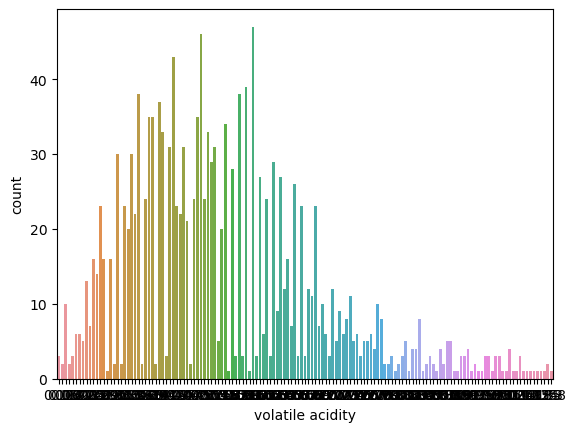

In [85]:
print(winequalitydata['volatile acidity'].value_counts())
wc=sns.countplot(x='volatile acidity',data=winequalitydata)
plt.show()

Highest number of wines has the following volatile acidity=0.600
Lowest number of wines has the following volatile acidity= 1.090,1.115,1.130

7.2     67
7.1     57
7.8     53
7.5     52
7.0     50
        ..
13.5     1
13.8     1
13.4     1
4.7      1
5.5      1
Name: fixed acidity, Length: 96, dtype: int64


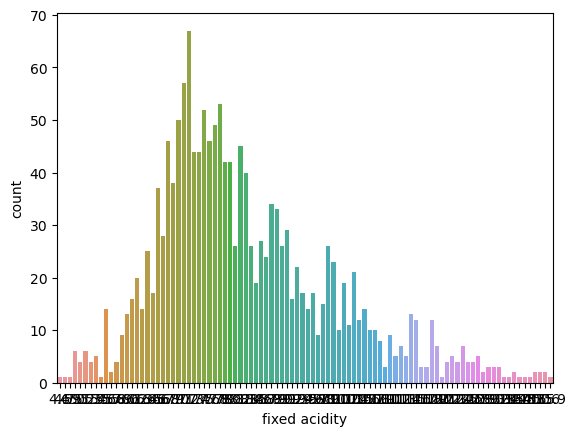

In [86]:
print(winequalitydata['fixed acidity'].value_counts())
wc=sns.countplot(x='fixed acidity',data=winequalitydata)
plt.show()

Highest number of wines has the following fixed acidity=7.2
Lowest number of wines has the following fixed acidity= 5.5

0.00    132
0.49     68
0.24     51
0.02     50
0.26     38
       ... 
0.72      1
0.62      1
0.75      1
1.00      1
0.78      1
Name: citric acid, Length: 80, dtype: int64


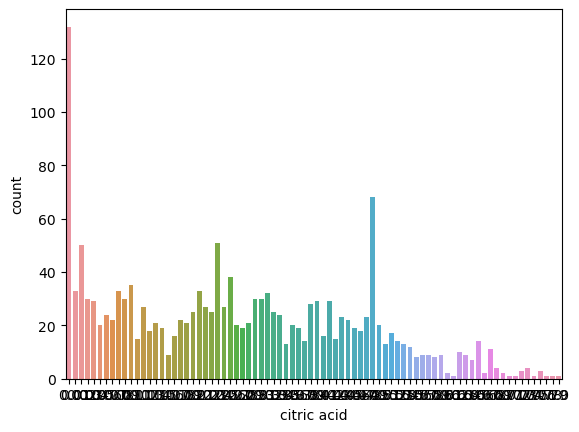

In [87]:
print(winequalitydata['citric acid'].value_counts())
wc=sns.countplot(x='citric acid',data=winequalitydata)
plt.show()

Highest number of wines has the following citric acid=0.00
Lowest number of wines has the following citric acid= 0.78

2.00     156
2.20     131
1.80     129
2.10     128
1.90     117
        ... 
4.25       1
2.85       1
3.45       1
2.35       1
13.90      1
Name: residual sugar, Length: 91, dtype: int64


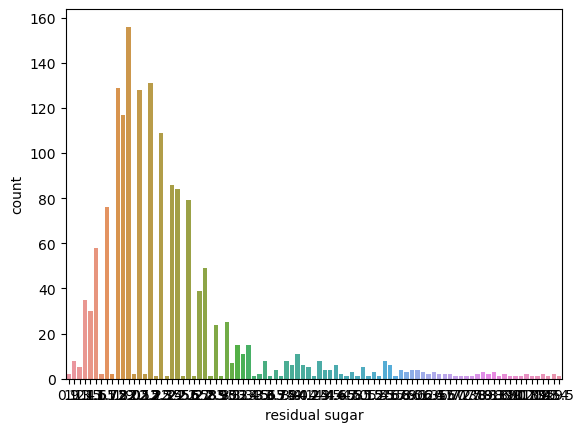

In [88]:
print(winequalitydata['residual sugar'].value_counts())
wc=sns.countplot(x='residual sugar',data=winequalitydata)
plt.show()

Highest number of wines has the following residual sugar=2.00
Lowest number of wines has the following residual sugar= 13.90 

0.080    66
0.074    55
0.076    51
0.078    51
0.084    49
         ..
0.108     1
0.148     1
0.143     1
0.222     1
0.230     1
Name: chlorides, Length: 153, dtype: int64


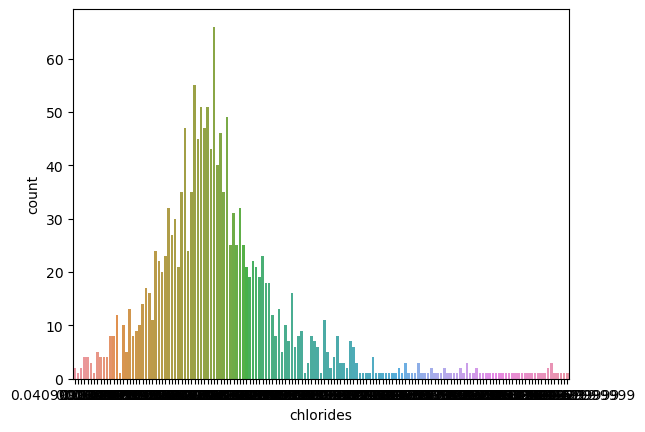

In [89]:
print(winequalitydata['chlorides'].value_counts())
wc=sns.countplot(x='chlorides',data=winequalitydata)
plt.show()

Highest number of wines has the following chlorides=0.080 
Lowest number of wines has the following chlorides= 0.230

6.0     138
5.0     104
10.0     79
15.0     78
12.0     75
7.0      71
9.0      62
16.0     61
17.0     60
11.0     59
13.0     57
8.0      56
14.0     50
3.0      49
18.0     46
4.0      41
21.0     41
19.0     39
24.0     34
26.0     32
23.0     32
20.0     30
27.0     29
25.0     24
29.0     23
28.0     23
22.0     22
32.0     22
31.0     20
34.0     18
30.0     16
35.0     15
36.0     11
33.0     11
38.0      9
41.0      7
40.0      6
39.0      5
48.0      4
51.0      4
45.0      3
1.0       3
43.0      3
42.0      3
52.0      3
37.0      3
68.0      2
55.0      2
50.0      2
37.5      2
53.0      1
72.0      1
57.0      1
47.0      1
5.5       1
2.0       1
46.0      1
54.0      1
40.5      1
66.0      1
Name: free sulfur dioxide, dtype: int64


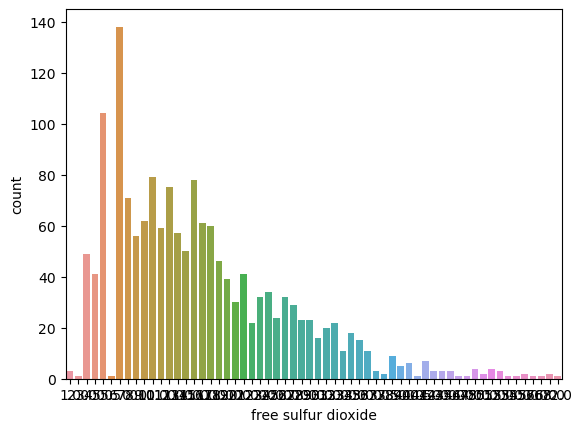

In [90]:
print(winequalitydata['free sulfur dioxide'].value_counts())
wc=sns.countplot(x='free sulfur dioxide',data=winequalitydata)
plt.show()

Highest number of wines has the following chlorides= 6.0 
Lowest number of wines has the following chlorides= 66.0

28.0     43
24.0     36
15.0     35
18.0     35
23.0     34
         ..
139.0     1
149.0     1
152.0     1
155.0     1
165.0     1
Name: total sulfur dioxide, Length: 144, dtype: int64


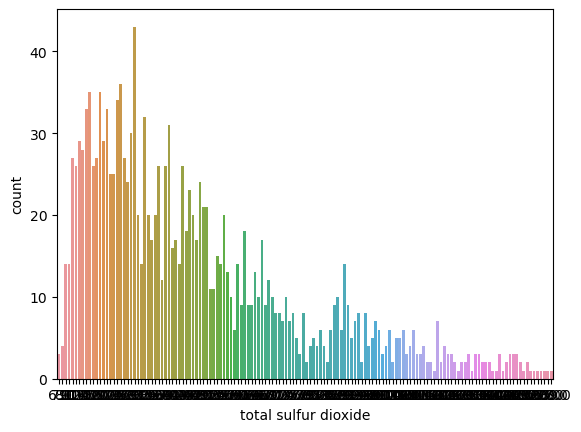

In [91]:
print(winequalitydata['total sulfur dioxide'].value_counts())
wc=sns.countplot(x='total sulfur dioxide',data=winequalitydata)
plt.show()

In [ ]:
Highest number of wines has the following total sulfur dioxide= 28.0 
Lowest number of wines has the following total sulfur dioxide= 165.0

0.99720    36
0.99680    35
0.99760    35
0.99800    29
0.99620    28
           ..
0.99684     1
0.99764     1
0.99473     1
0.99320     1
0.99651     1
Name: density, Length: 436, dtype: int64


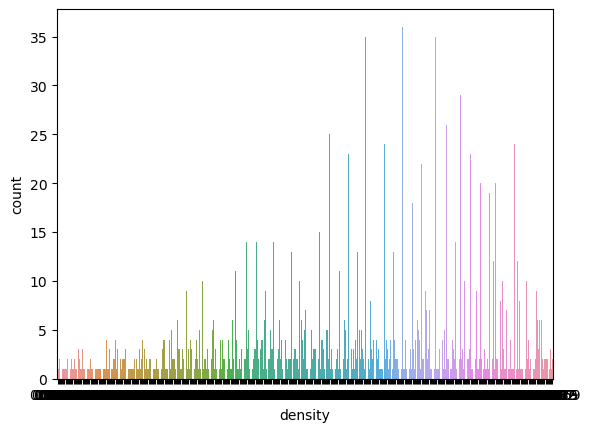

In [92]:
print(winequalitydata['density'].value_counts())
wc=sns.countplot(x='density',data=winequalitydata)
plt.show()

Highest number of wines has the following density= 0.99720 
Lowest number of wines has the following density= 0.99651

3.30    57
3.36    56
3.26    53
3.38    48
3.39    48
        ..
3.75     1
2.74     1
3.70     1
3.85     1
2.90     1
Name: pH, Length: 89, dtype: int64


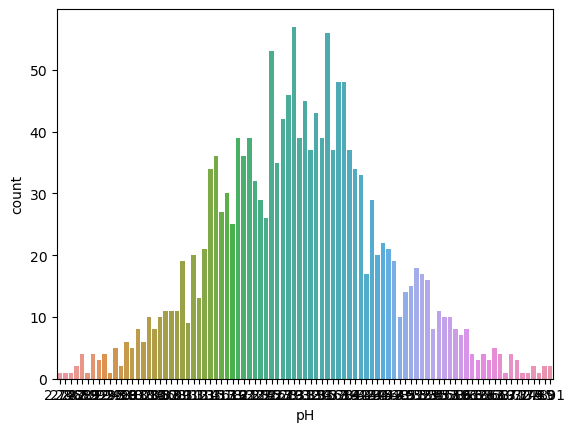

In [93]:
print(winequalitydata['pH'].value_counts())
wc=sns.countplot(x='pH',data=winequalitydata)
plt.show()

Highest number of wines has the following ph= 3.30 
Lowest number of wines has the following ph= 2.90 

9.500000     139
9.400000     103
9.800000      78
9.200000      72
10.000000     67
            ... 
9.950000       1
9.233333       1
9.250000       1
9.050000       1
10.750000      1
Name: alcohol, Length: 65, dtype: int64


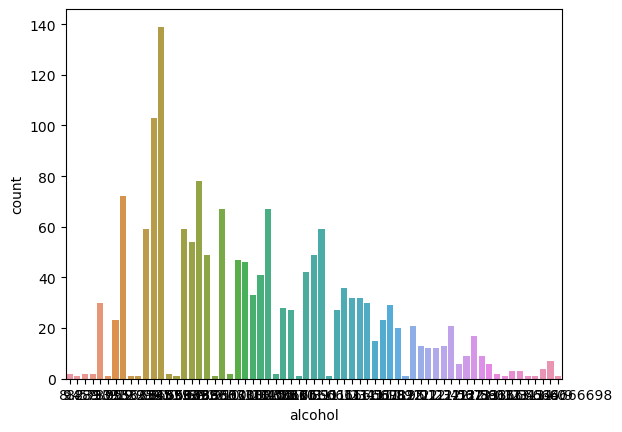

In [94]:
print(winequalitydata['alcohol'].value_counts())
wc=sns.countplot(x='alcohol',data=winequalitydata)
plt.show()

Highest number of wines has the following alcohol= 9.500000 
Lowest number of wines has the following alcohol=  10.750000 

0.60    69
0.58    68
0.54    68
0.62    61
0.56    60
        ..
1.00     1
1.59     1
0.33     1
1.26     1
1.01     1
Name: sulphates, Length: 96, dtype: int64


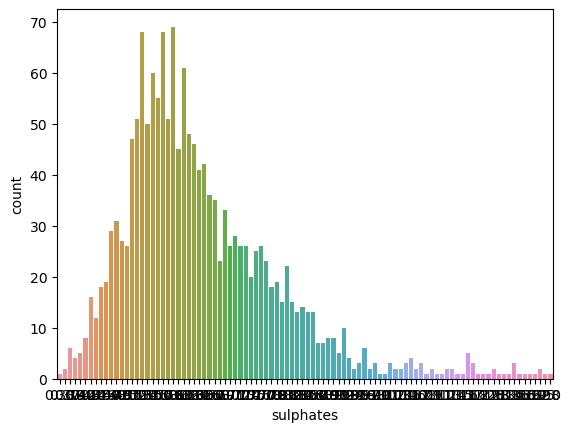

In [95]:
print(winequalitydata['sulphates'].value_counts())
wc=sns.countplot(x='sulphates',data=winequalitydata)
plt.show()

Highest number of wines has the following sulphates= 0.60  
Lowest number of wines has the following sulphates=  1.01  

Now let's visulaise the distribution of our input columns using subplots and if loops untill all 11 columns are plotted.

C:\Users\ACHU NARAYAN\AppData\Local\Temp\ipykernel_36132\2250570567.py:6: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(winequalitydata[col],color="b")
C:\Users\ACHU NARAYAN\AppData\Local\Temp\ipykernel_36132\2250570567.py:6: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(winequalitydata[col],col

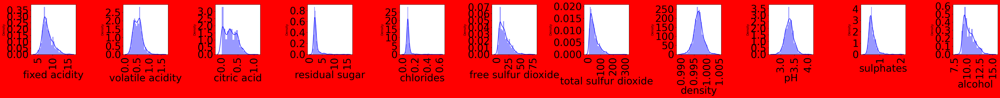

In [181]:
plt.figure(figsize=(45,45),facecolor = "red")
plotnumber=1
for col in winecategory_col:
    if plotnumber<=12:
        wc=plt.subplot(11,11,plotnumber)
        sns.distplot(winequalitydata[col],color="b")
        plt.xlabel(col,rotation=0,fontsize = 32)
        plt.xticks(rotation=90, fontsize=32)
        plt.yticks(rotation = 0, fontsize = 32)
    plotnumber+=1
plt.tight_layout()
    

Skewness is visibile in - fixed acidity,volatile acidity,residual sugar,chlorides,free sulfur dioxide,total sulfur oxide, sulphates and alcohol
Now let's look at some strip plots to understand correlation between different variables in the dataset

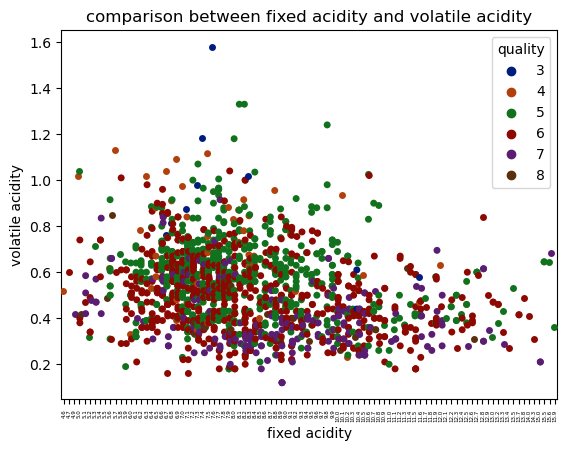

<Figure size 2800x200 with 0 Axes>

In [166]:
plt.title("comparison between fixed acidity and volatile acidity")
sns.stripplot(x= "fixed acidity", y= "volatile acidity", data = winequalitydata,hue='quality', palette='dark',dodge=True)
plt.xticks(rotation=90, fontsize=4)
plt.figure(figsize=(28, 2))
plt.show()

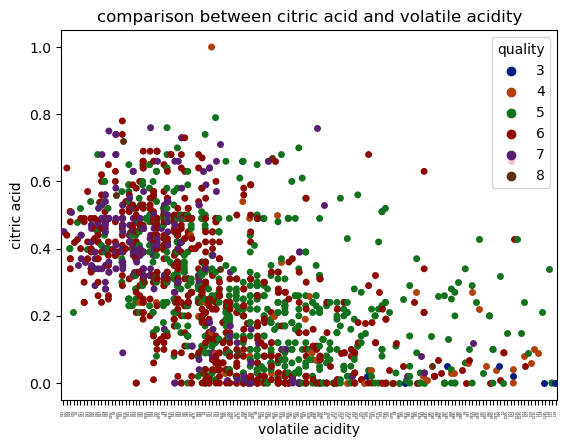

In [4]:
plt.title("comparison between citric acid and volatile acidity")
sns.stripplot(x= "volatile acidity", y= "citric acid", data = winequalitydata, hue='quality', palette='dark',dodge=True)
plt.xticks(rotation=90, fontsize=2)
plt.show()

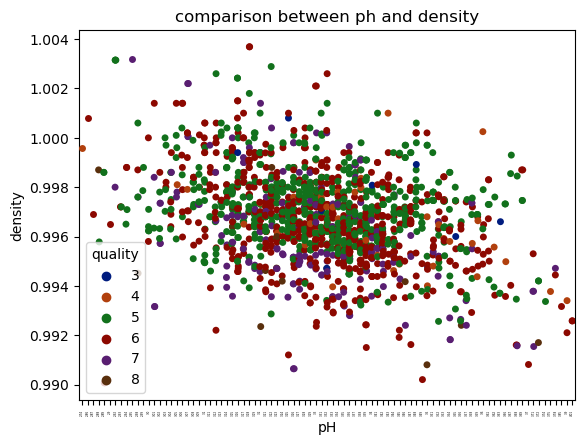

In [23]:
plt.title("comparison between ph and density")
sns.stripplot(x= "pH", y= "density", data = winequalitydata, hue='quality', palette='dark')
plt.xticks(rotation=90, fontsize=2)
plt.show()

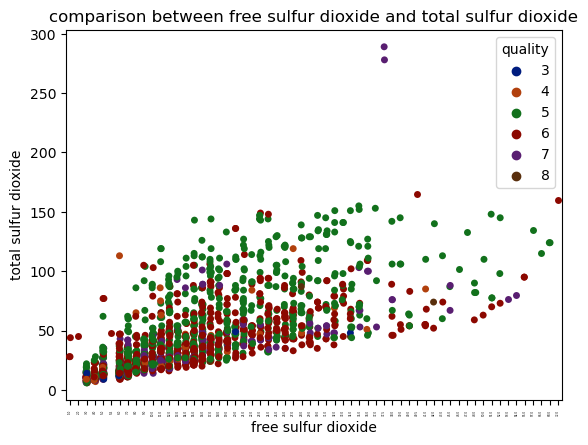

In [5]:
plt.title("comparison between free sulfur dioxide and total sulfur dioxide")
sns.stripplot(x= "free sulfur dioxide", y= "total sulfur dioxide", data = winequalitydata, hue='quality', palette='dark')
plt.xticks(rotation=90, fontsize=2)
plt.show()

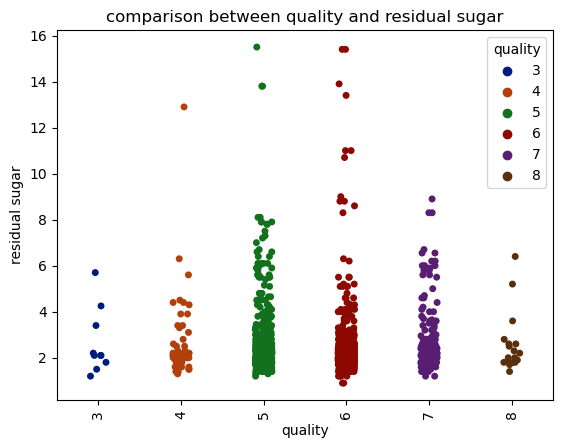

In [183]:
plt.title("comparison between quality and residual sugar")
sns.stripplot(x= "quality", y= "residual sugar", data = winequalitydata, hue='quality', palette='dark')
plt.xticks(rotation=90, fontsize=10)
plt.show()

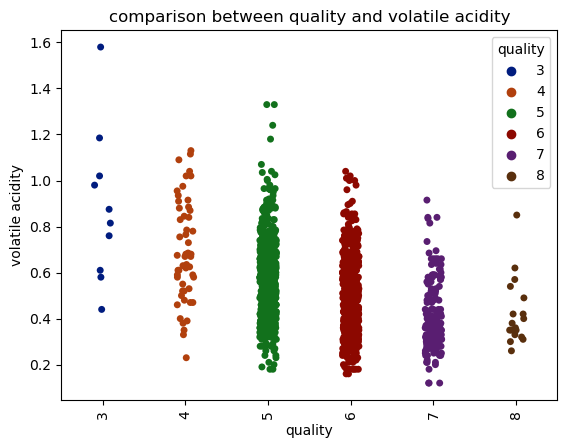

In [184]:
plt.title("comparison between quality and volatile acidity")
sns.stripplot(x= "quality", y= "volatile acidity", data = winequalitydata, hue='quality', palette='dark')
plt.xticks(rotation=90, fontsize=10)
plt.show()

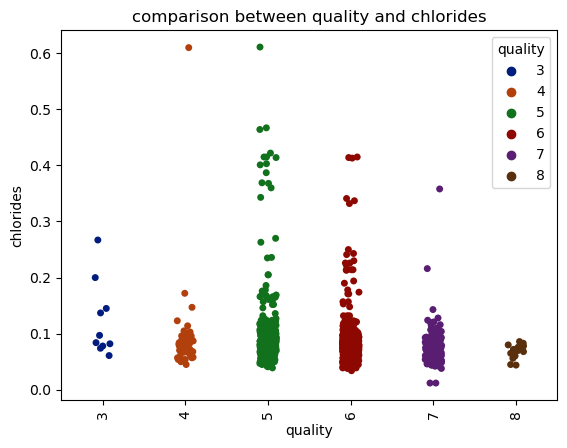

In [6]:
plt.title("comparison between quality and chlorides")
sns.stripplot(x= "quality", y= "chlorides", data = winequalitydata, hue='quality', palette='dark')
plt.xticks(rotation=90, fontsize=10)
plt.show()

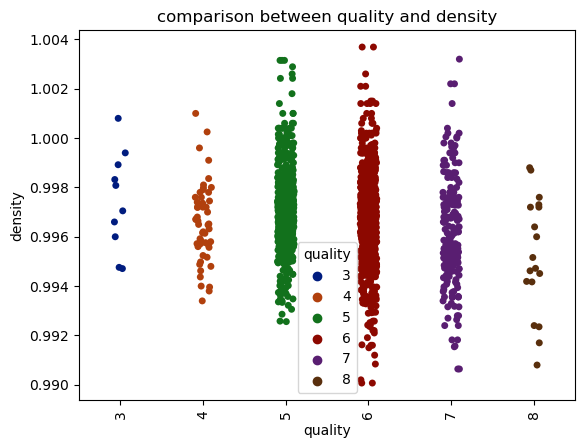

In [186]:
plt.title("comparison between quality and density")
sns.stripplot(x= "quality", y= "density", data = winequalitydata, hue='quality', palette='dark')
plt.xticks(rotation=90, fontsize=10)
plt.show()

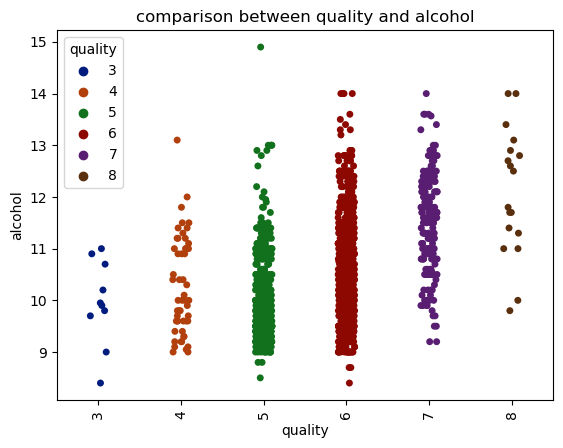

In [187]:
plt.title("comparison between quality and alcohol")
sns.stripplot(x= "quality", y= "alcohol", data = winequalitydata, hue='quality', palette='dark')
plt.xticks(rotation=90, fontsize=10)
plt.show()

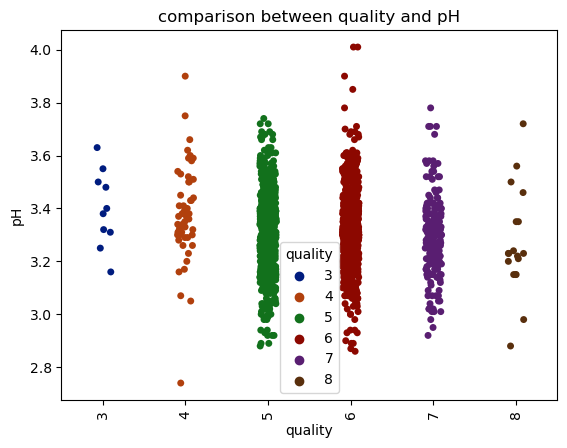

In [7]:
plt.title("comparison between quality and pH")
sns.stripplot(x= "quality", y= "pH", data = winequalitydata, hue='quality', palette='dark')
plt.xticks(rotation=90, fontsize=10)
plt.show()

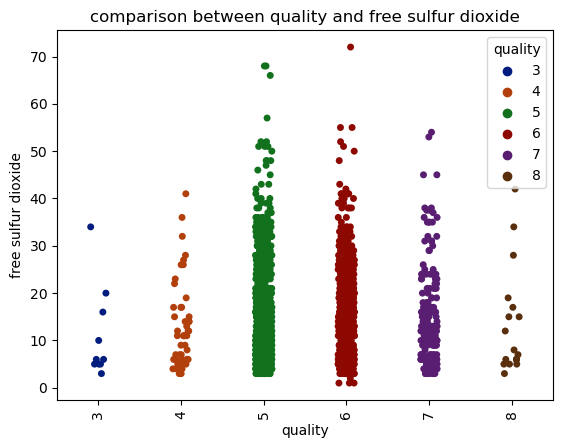

In [8]:
plt.title("comparison between quality and free sulfur dioxide")
sns.stripplot(x= "quality", y= "free sulfur dioxide", data = winequalitydata, hue='quality', palette='dark')
plt.xticks(rotation=90, fontsize=10)
plt.show()

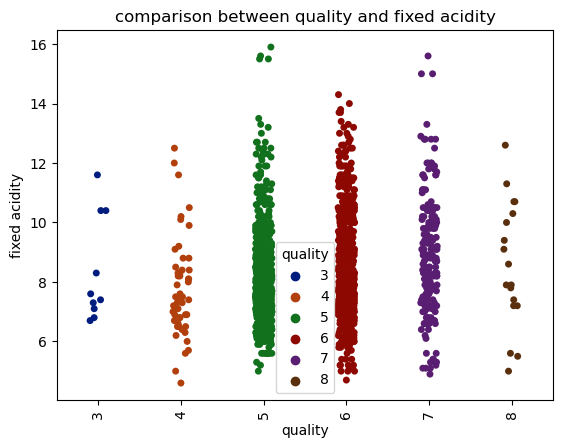

In [9]:
plt.title("comparison between quality and fixed acidity")
sns.stripplot(x= "quality", y= "fixed acidity", data = winequalitydata, hue='quality', palette='dark')
plt.xticks(rotation=90, fontsize=10)
plt.show()

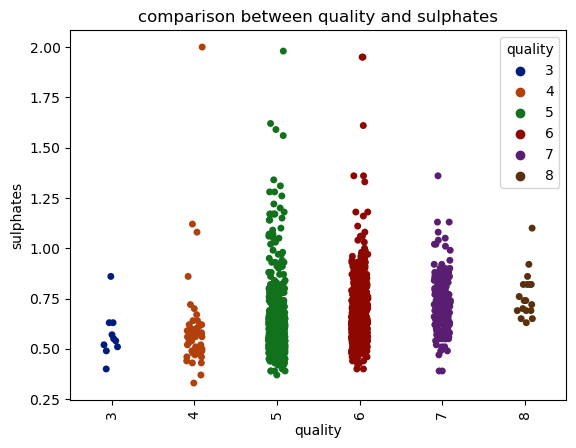

In [10]:
plt.title("comparison between quality and sulphates")
sns.stripplot(x= "quality", y= "sulphates", data = winequalitydata, hue='quality', palette='dark')
plt.xticks(rotation=90, fontsize=10)
plt.show()

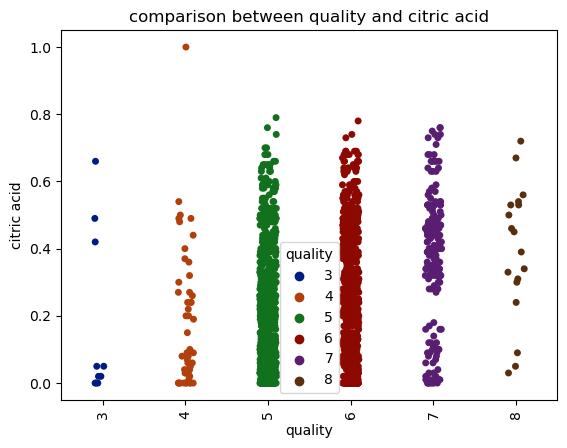

In [11]:
plt.title("comparison between quality and citric acid")
sns.stripplot(x= "quality", y= "citric acid", data = winequalitydata, hue='quality', palette='dark')
plt.xticks(rotation=90, fontsize=10)
plt.show()

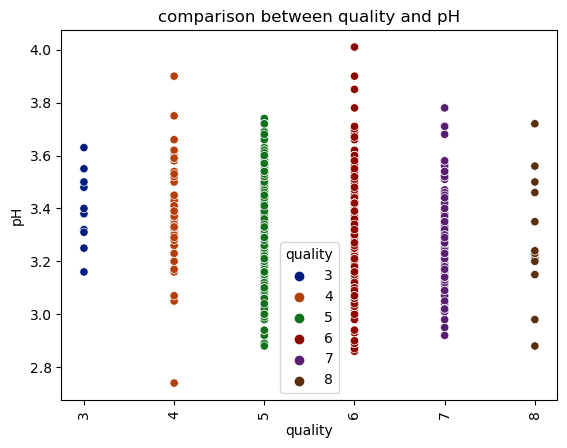

In [12]:
plt.title("comparison between quality and pH")
sns.scatterplot(x= "quality", y= "pH", data = winequalitydata, hue='quality', palette='dark')
plt.xticks(rotation=90, fontsize=10)
plt.show()

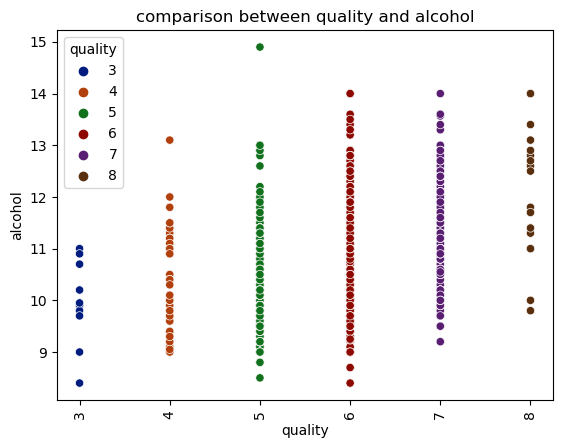

In [194]:
plt.title("comparison between quality and alcohol")
sns.scatterplot(x= "quality", y= "alcohol", data = winequalitydata, hue='quality', palette='dark')
plt.xticks(rotation=90, fontsize=10)
plt.show()

Now let's visulaise correlation between target variable and input variables using barplots

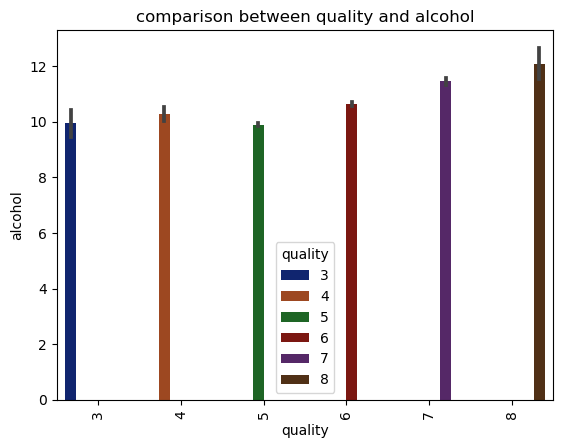

In [195]:
plt.title("comparison between quality and alcohol")
sns.barplot(x= "quality", y= "alcohol", data = winequalitydata, hue='quality', palette='dark')
plt.xticks(rotation=90, fontsize=10)
plt.show()

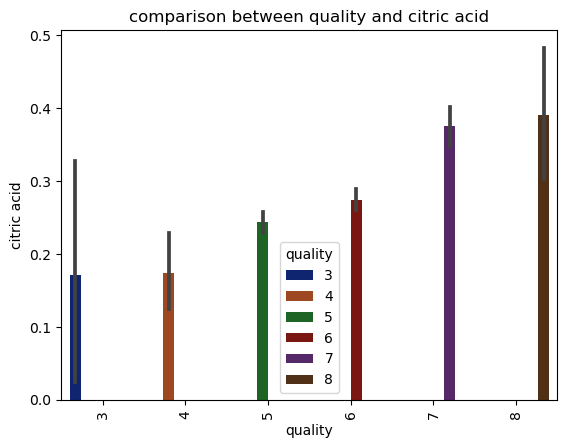

In [196]:
plt.title("comparison between quality and citric acid")
sns.barplot(x= "quality", y= "citric acid", data = winequalitydata, hue='quality', palette='dark')
plt.xticks(rotation=90, fontsize=10)
plt.show()

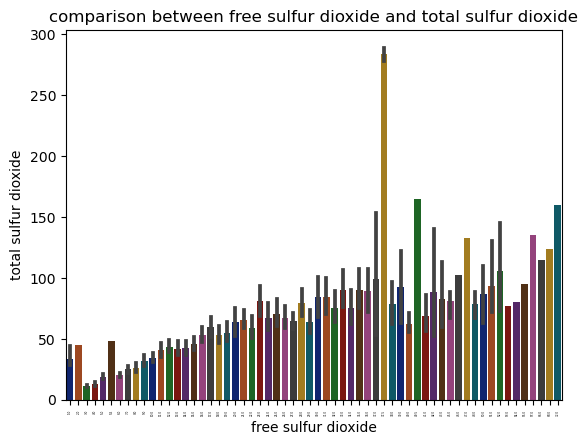

In [96]:
plt.title("comparison between free sulfur dioxide and total sulfur dioxide")
sns.barplot(x= "free sulfur dioxide", y= "total sulfur dioxide", data = winequalitydata, palette='dark')
plt.xticks(rotation=90, fontsize=2)
plt.show()

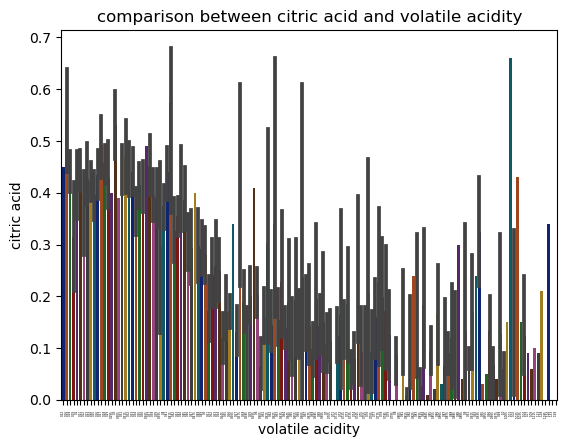

In [97]:
plt.title("comparison between citric acid and volatile acidity")
sns.barplot(x= "volatile acidity", y= "citric acid", data = winequalitydata, palette='dark',dodge=True)
plt.xticks(rotation=90, fontsize=2)
plt.show()

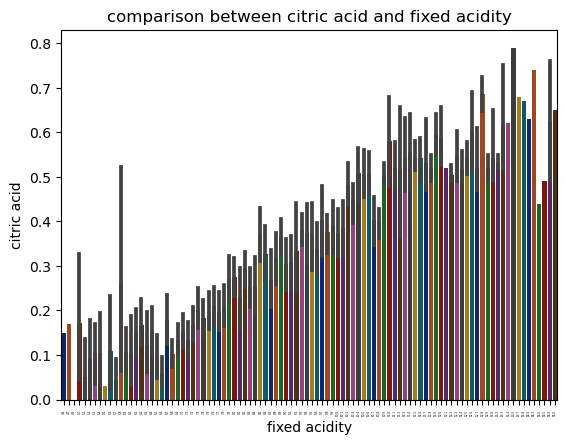

In [98]:
plt.title("comparison between citric acid and fixed acidity")
sns.barplot(x= "fixed acidity", y= "citric acid", data = winequalitydata, palette='dark',dodge=True)
plt.xticks(rotation=90, fontsize=2)
plt.show()

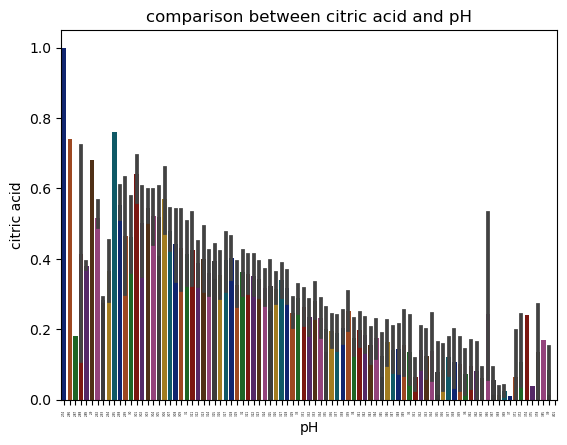

In [99]:
plt.title("comparison between citric acid and pH")
sns.barplot(x= "pH", y= "citric acid", data = winequalitydata, palette='dark',dodge=True)
plt.xticks(rotation=90, fontsize=2)
plt.show()

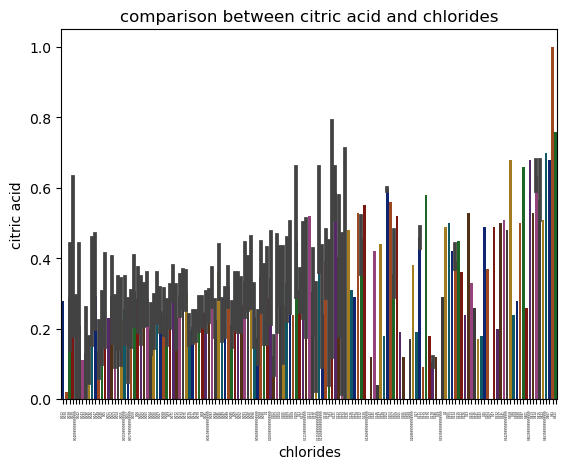

In [100]:
plt.title("comparison between citric acid and chlorides")
sns.barplot(x= "chlorides", y= "citric acid", data = winequalitydata, palette='dark',dodge=True)
plt.xticks(rotation=90, fontsize=2)
plt.show()

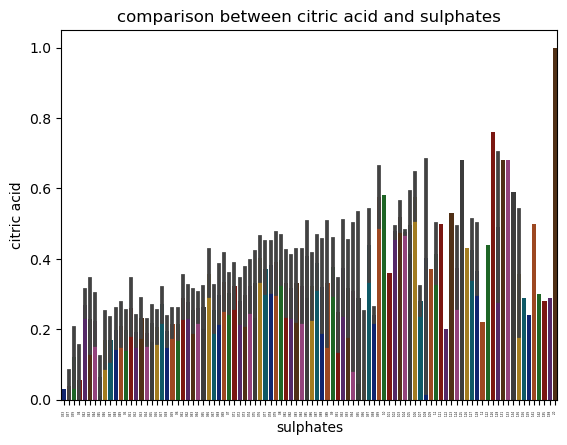

In [101]:
plt.title("comparison between citric acid and sulphates")
sns.barplot(x= "sulphates", y= "citric acid", data = winequalitydata, palette='dark',dodge=True)
plt.xticks(rotation=90, fontsize=2)
plt.show()

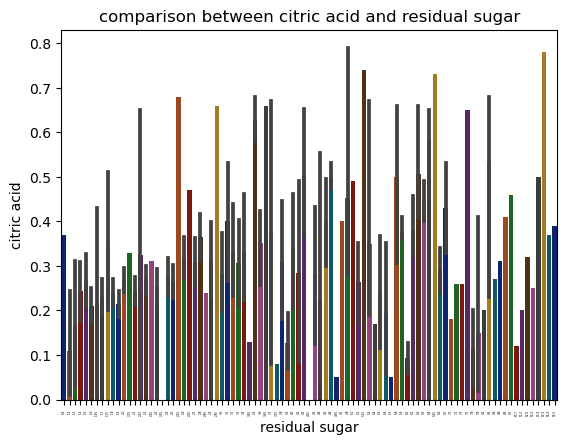

In [102]:
plt.title("comparison between citric acid and residual sugar")
sns.barplot(x= "residual sugar", y= "citric acid", data = winequalitydata, palette='dark',dodge=True)
plt.xticks(rotation=90, fontsize=2)
plt.show()

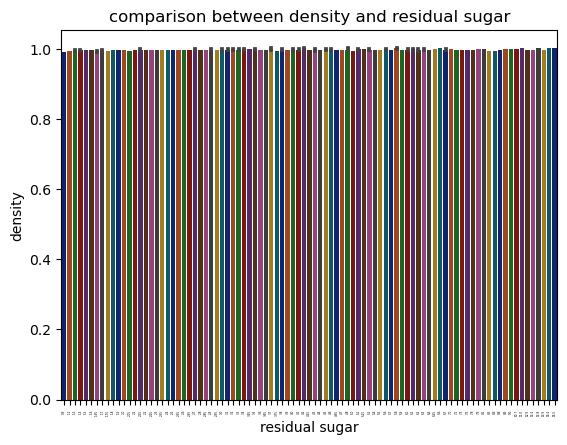

In [103]:
plt.title("comparison between density and residual sugar")
sns.barplot(x= "residual sugar", y= "density", data = winequalitydata, palette='dark',dodge=True)
plt.xticks(rotation=90, fontsize=2)
plt.show()

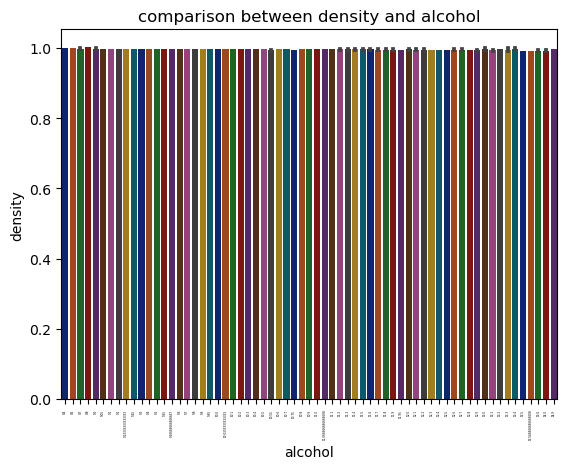

In [104]:
plt.title("comparison between density and alcohol")
sns.barplot(x= "alcohol", y= "density", data = winequalitydata, palette='dark',dodge=True)
plt.xticks(rotation=90, fontsize=2)
plt.show()

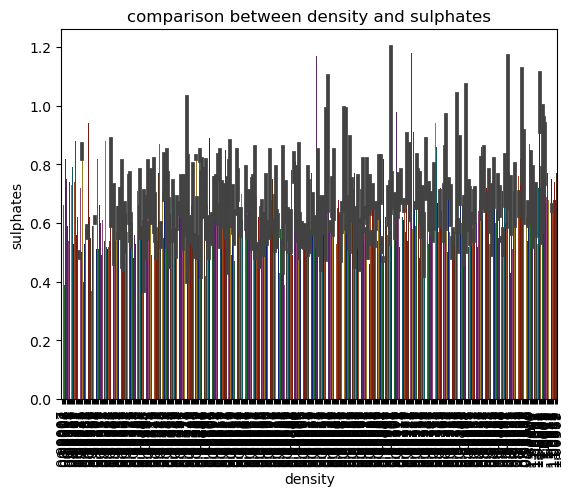

In [105]:
plt.title("comparison between density and sulphates")
sns.barplot(x= "density", y= "sulphates", data = winequalitydata, palette='dark')
plt.xticks(rotation=90, fontsize=10)
plt.show()

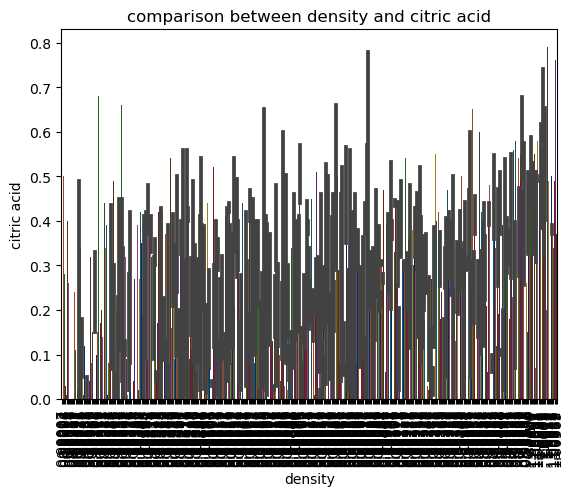

In [106]:
plt.title("comparison between density and citric acid")
sns.barplot(x= "density", y= "citric acid", data = winequalitydata, palette='dark')
plt.xticks(rotation=90, fontsize=10)
plt.show()

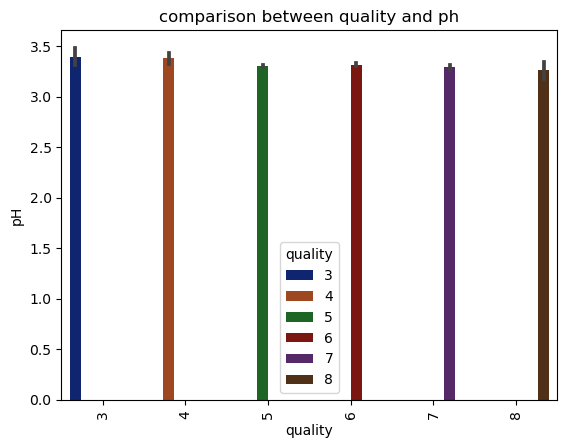

In [14]:
plt.title("comparison between quality and ph")
sns.barplot(x= "quality", y= "pH", data = winequalitydata, hue='quality', palette='dark')
plt.xticks(rotation=90, fontsize=10)
plt.show()

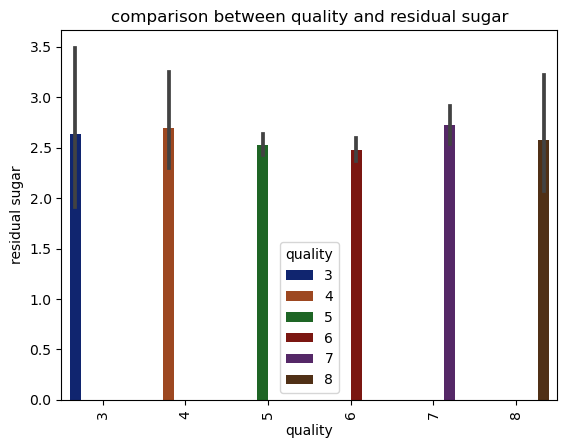

In [15]:
plt.title("comparison between quality and residual sugar")
sns.barplot(x= "quality", y= "residual sugar", data = winequalitydata, hue='quality', palette='dark')
plt.xticks(rotation=90, fontsize=10)
plt.show()

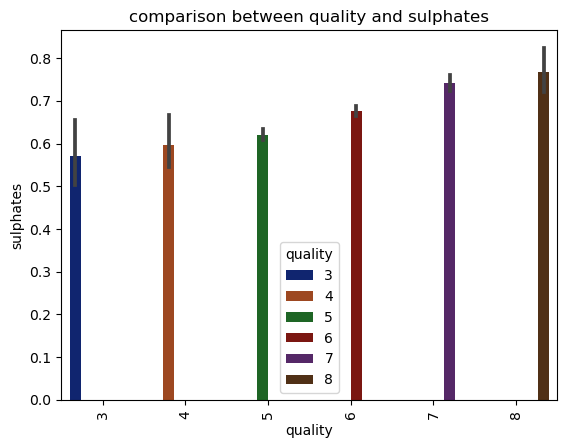

In [201]:
plt.title("comparison between quality and sulphates")
sns.barplot(x= "quality", y= "sulphates", data = winequalitydata, hue='quality', palette='dark')
plt.xticks(rotation=90, fontsize=10)
plt.show()

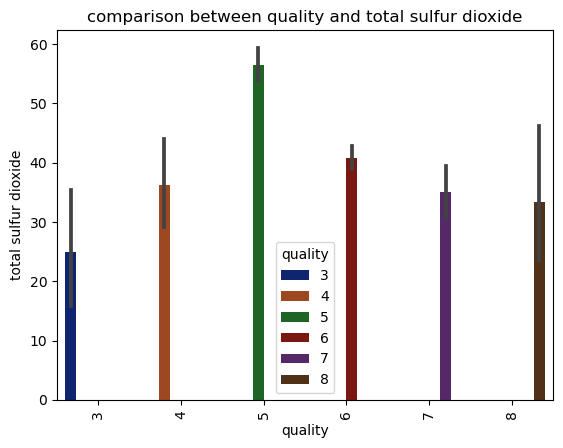

In [16]:
plt.title("comparison between quality and total sulfur dioxide")
sns.barplot(x= "quality", y= "total sulfur dioxide", data = winequalitydata, hue='quality', palette='dark')
plt.xticks(rotation=90, fontsize=10)
plt.show()

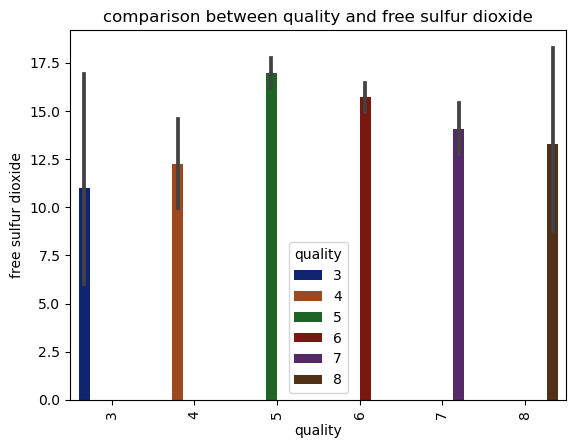

In [17]:
plt.title("comparison between quality and free sulfur dioxide")
sns.barplot(x= "quality", y= "free sulfur dioxide", data = winequalitydata, hue='quality', palette='dark')
plt.xticks(rotation=90, fontsize=10)
plt.show()

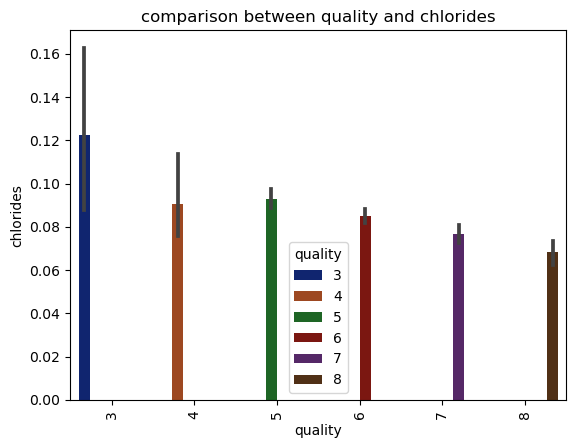

In [19]:
plt.title("comparison between quality and chlorides")
sns.barplot(x= "quality", y= "chlorides", data = winequalitydata, hue='quality', palette='dark')
plt.xticks(rotation=90, fontsize=10)
plt.show()

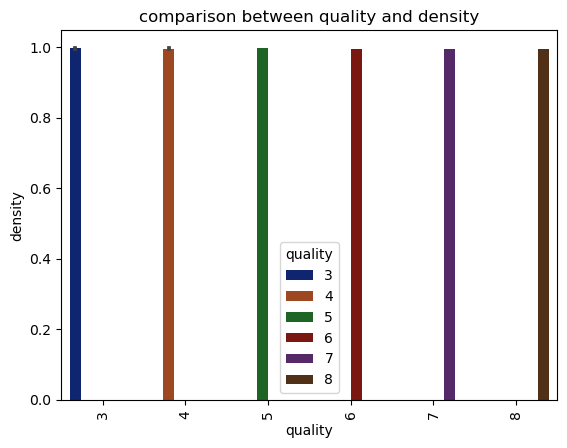

In [27]:
plt.title("comparison between quality and density")
sns.barplot(x= "quality", y= "density", data = winequalitydata, hue='quality', palette='dark')
plt.xticks(rotation=90, fontsize=10)
plt.show()

From the barplots we can see that there is clear corelation between the following variables-
quality and sulphates
quality and alcohol
quality and citric acid
quality and chlorides
free sulfur oxide and total sulfur oxide
fixed acidity and citric acid
ph and citric acid
citric acid and volatile acidity


Now let's visualise some catplots of target variable and input variables

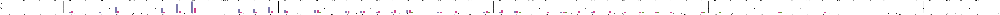

<Figure size 12800x12800 with 0 Axes>

In [212]:
sns.catplot(x= 'quality', col= 'alcohol', data = winequalitydata, kind="count", palette='Dark2')
plt.figure(figsize=(128, 128))
plt.show()

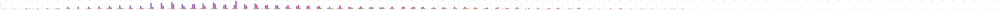

<Figure size 2800x2800 with 0 Axes>

In [211]:
sns.catplot(x= 'quality', col= 'sulphates', data = winequalitydata, kind="count", palette='Dark2')
plt.figure(figsize=(128, 128))
plt.show()

In [18]:
sns.catplot(x='quality', col='total sulfur dioxide', data=winequalitydata, kind="count", palette='Dark2', height=5, aspect=1.5, col_wrap=3)

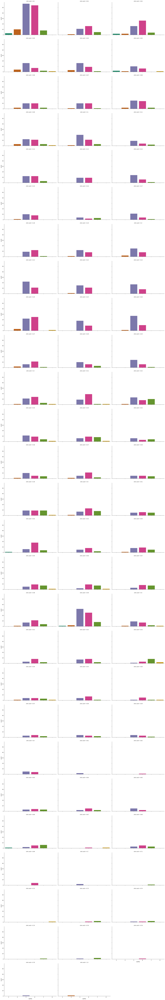

In [19]:
sns.catplot(x='quality', col='citric acid', data=winequalitydata, kind="count", palette='Dark2', height=5, aspect=1.5, col_wrap=3)

In [20]:
sns.catplot(x='quality', col='volatile acidity', data=winequalitydata, kind="count", palette='Dark2', height=5, aspect=1.5, col_wrap=3)

Now let's segment wine quality by setting all wine with quality 7 or 8 as 1(good), and anything below as zero(not good) 

In [107]:
winequalitydata['quality'] = winequalitydata['quality'].apply(lambda x: 1 if x >= 7 else 0)

In [108]:
print(winequalitydata.head(40))

    fixed acidity  volatile acidity  citric acid  residual sugar  chlorides  \
0             7.4             0.700         0.00             1.9      0.076   
1             7.8             0.880         0.00             2.6      0.098   
2             7.8             0.760         0.04             2.3      0.092   
3            11.2             0.280         0.56             1.9      0.075   
4             7.4             0.700         0.00             1.9      0.076   
5             7.4             0.660         0.00             1.8      0.075   
6             7.9             0.600         0.06             1.6      0.069   
7             7.3             0.650         0.00             1.2      0.065   
8             7.8             0.580         0.02             2.0      0.073   
9             7.5             0.500         0.36             6.1      0.071   
10            6.7             0.580         0.08             1.8      0.097   
11            7.5             0.500         0.36    

Now you can see the values have changed into binary format and will be easier for us to create a model and predict values accurately

Now let's visualise bivariate analysis of input and output variables using barplots based on the changes we have made in the dataset

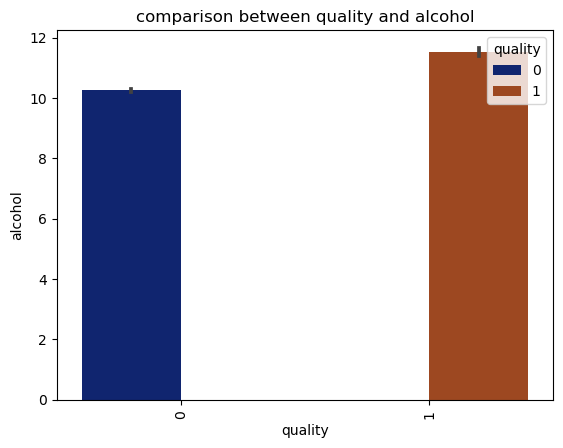

In [639]:
plt.title("comparison between quality and alcohol")
sns.barplot(x= "quality", y= "alcohol", data = winequalitydata, hue='quality', palette='dark')
plt.xticks(rotation=90, fontsize=10)
plt.show()

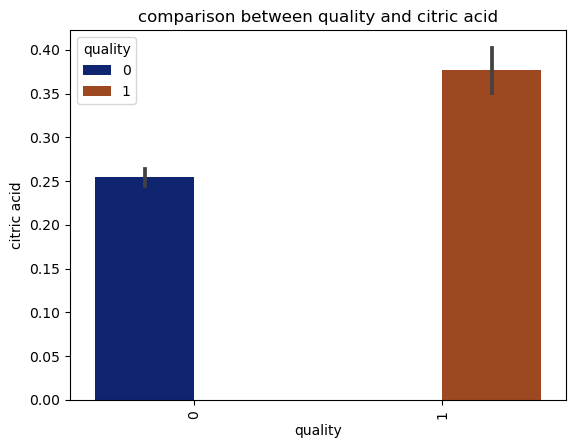

In [112]:
plt.title("comparison between quality and citric acid")
sns.barplot(x= "quality", y= "citric acid", data = winequalitydata, hue='quality', palette='dark')
plt.xticks(rotation=90, fontsize=10)
plt.show()

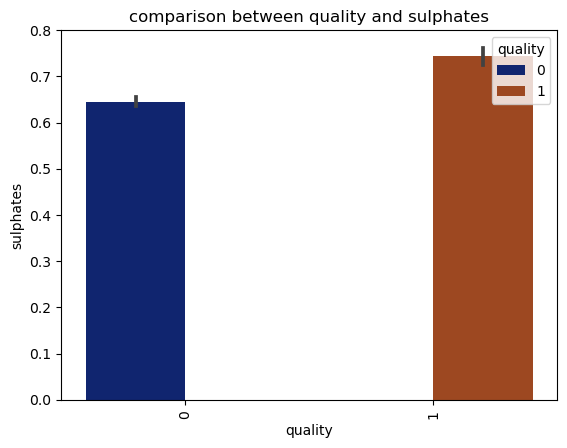

In [111]:
plt.title("comparison between quality and sulphates")
sns.barplot(x= "quality", y= "sulphates", data = winequalitydata, hue='quality', palette='dark')
plt.xticks(rotation=90, fontsize=10)
plt.show()

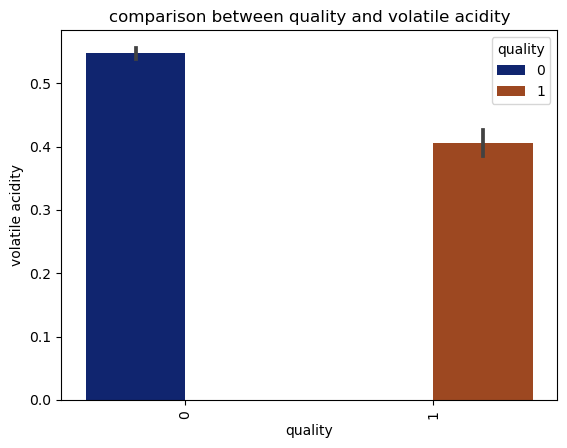

In [110]:
plt.title("comparison between quality and volatile acidity")
sns.barplot(x= "quality", y= "volatile acidity", data = winequalitydata, hue='quality', palette='dark')
plt.xticks(rotation=90, fontsize=10)
plt.show()

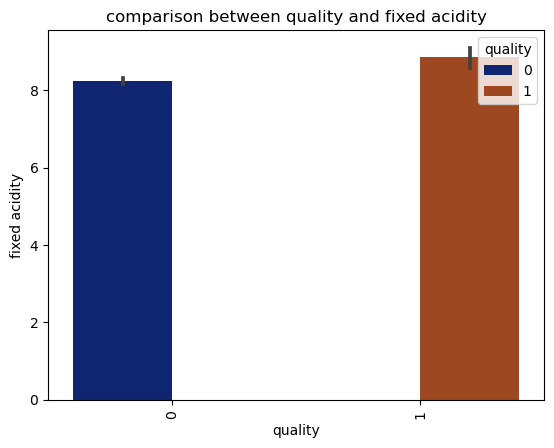

In [119]:
plt.title("comparison between quality and fixed acidity")
sns.barplot(x= "quality", y= "fixed acidity", data = winequalitydata, hue='quality', palette='dark')
plt.xticks(rotation=90, fontsize=10)
plt.show()

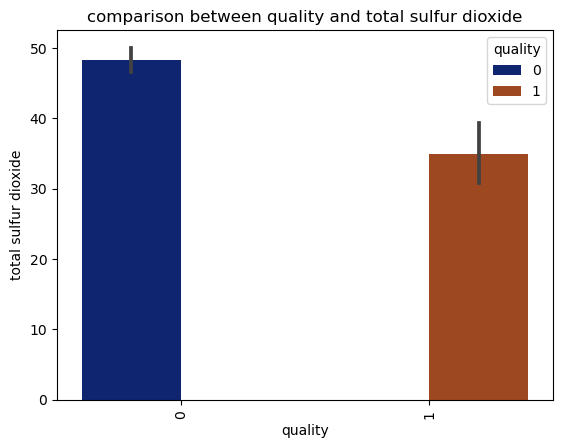

In [117]:
plt.title("comparison between quality and total sulfur dioxide")
sns.barplot(x= "quality", y= "total sulfur dioxide", data = winequalitydata, hue='quality', palette='dark')
plt.xticks(rotation=90, fontsize=10)
plt.show()

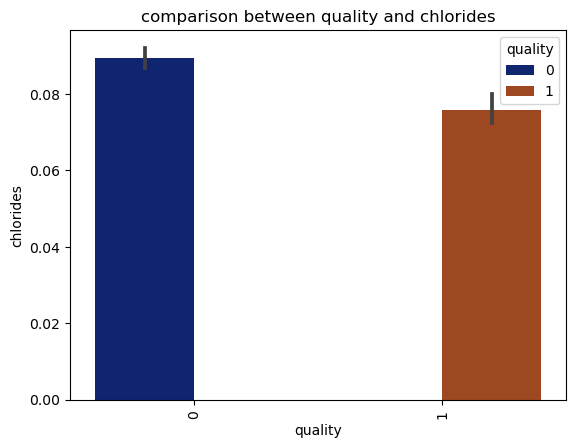

In [114]:
plt.title("comparison between quality and chlorides")
sns.barplot(x= "quality", y= "chlorides", data = winequalitydata, hue='quality', palette='dark')
plt.xticks(rotation=90, fontsize=10)
plt.show()

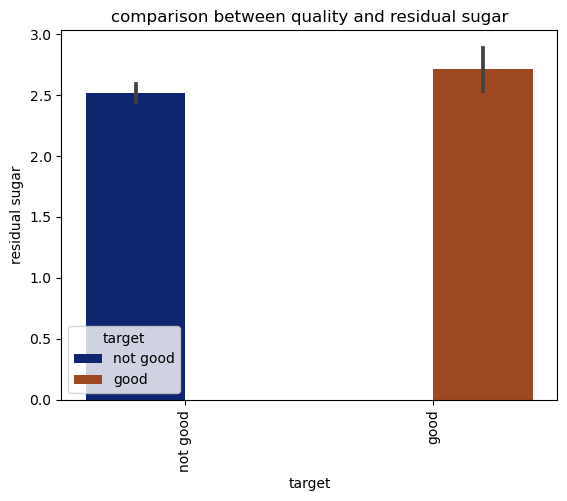

In [329]:
plt.title("comparison between quality and residual sugar")
sns.barplot(x= "quality", y= "residual sugar", data = winequalitydata, hue='quality', palette='dark')
plt.xticks(rotation=90, fontsize=10)
plt.show()

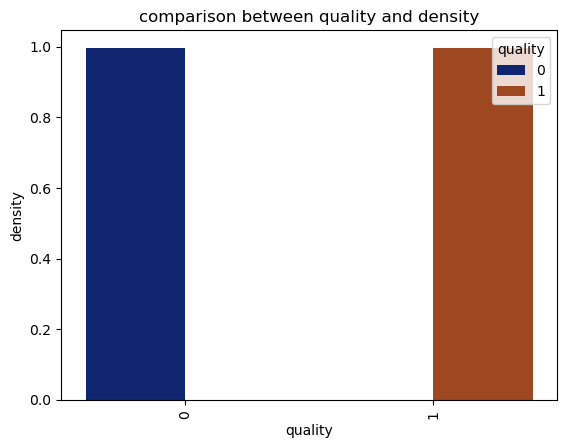

In [113]:
plt.title("comparison between quality and density")
sns.barplot(x= "quality", y= "density", data = winequalitydata, hue='quality', palette='dark')
plt.xticks(rotation=90, fontsize=10)
plt.show()

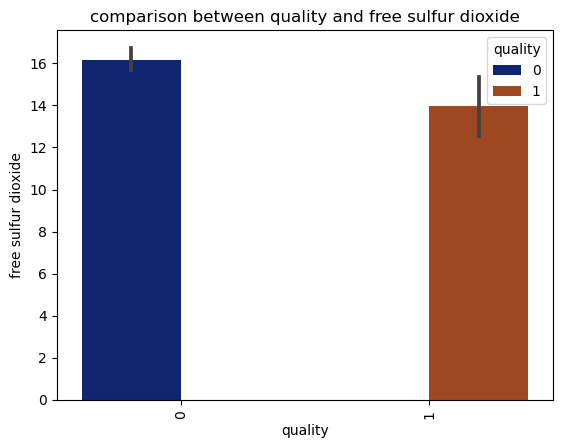

In [116]:
plt.title("comparison between quality and free sulfur dioxide")
sns.barplot(x= "quality", y= "free sulfur dioxide", data = winequalitydata, hue='quality', palette='dark')
plt.xticks(rotation=90, fontsize=10)
plt.show()

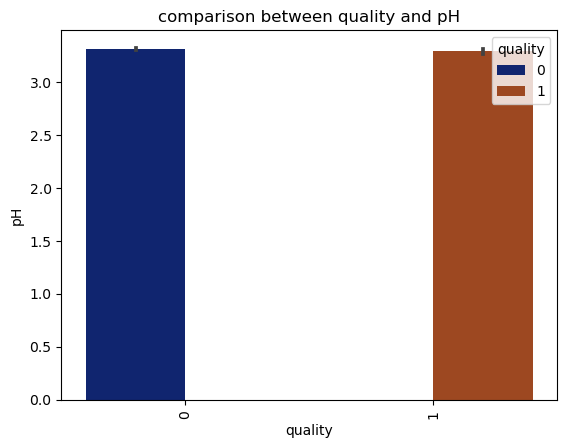

In [118]:
plt.title("comparison between quality and pH")
sns.barplot(x= "quality", y= "pH", data = winequalitydata, hue='quality', palette='dark')
plt.xticks(rotation=90, fontsize=10)
plt.show()

We can clearly see that alcohol, citric acid, chlorides, sulphates, volatile acidity, total sulfur dioxide,  free sulfur dioxide and residual sugar are different( high or low) for good and not good wines.

Now let's look at multivariate analysis through pairplots of the dataset

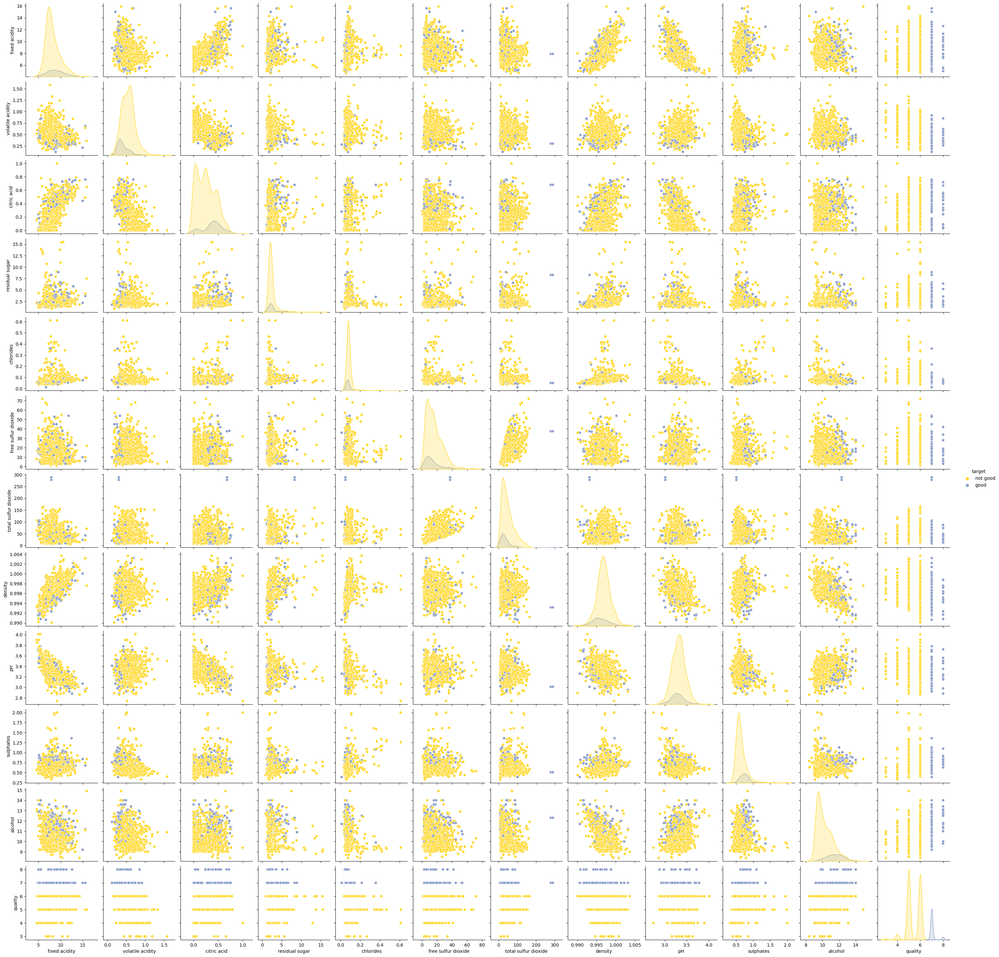

In [328]:
sns.pairplot(winequalitydata, hue='wine rating', palette='Set2_r')
plt.show()

Following input variables are correlated when we did multivariate analysis-
density and citric acid
density and pH
density and fixed acidity
ph and fixed acidity
ph and alcohol
ph and chlorides
density and alcohol
total sulfur dioxide and free sulfur dioxide



Now let's look at boxplots to see if outliers are present

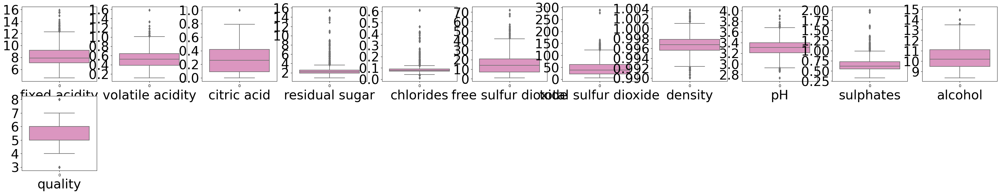

In [29]:
plt.figure(figsize=(45,45),facecolor = "white")
plotnumber=1
for col in winequalitydata:
    if plotnumber<=12:
        wc=plt.subplot(11,11,plotnumber)
        sns.boxplot(winequalitydata[col],palette="Set2_r")
        plt.xlabel(col,rotation=0,fontsize = 33)
        plt.yticks(rotation = 0, fontsize = 33)
    plotnumber+=1
plt.show()

A lot of outliers are present and they need to removed later using z-score method before model selection and prediction

Now let's check for skewness in the datasets

In [385]:
winequalitydata.skew()

C:\Users\ACHU NARAYAN\AppData\Local\Temp\ipykernel_36132\787161586.py:1: FutureWarning: The default value of numeric_only in DataFrame.skew is deprecated. In a future version, it will default to False. In addition, specifying 'numeric_only=None' is deprecated. Select only valid columns or specify the value of numeric_only to silence this warning.
  winequalitydata.skew()


fixed acidity           0.982751
volatile acidity        0.671593
citric acid             0.318337
residual sugar          4.540655
chlorides               5.680347
free sulfur dioxide     1.250567
total sulfur dioxide    1.515531
density                 0.071288
pH                      0.193683
sulphates               2.428672
alcohol                 0.860829
quality                 0.217802
dtype: float64

Let's reduce the skewness with cube root formula from numpy

In [386]:
winequalitydata['free sulfur dioxide']=np.cbrt(winequalitydata['free sulfur dioxide'])
winequalitydata['total sulfur dioxide']=np.cbrt(winequalitydata['total sulfur dioxide'])
winequalitydata['fixed acidity']=np.cbrt(winequalitydata['fixed acidity'])
winequalitydata['residual sugar']=np.cbrt(winequalitydata['residual sugar'])
winequalitydata['sulphates']=np.cbrt(winequalitydata['sulphates'])
winequalitydata['chlorides']=np.cbrt(winequalitydata['chlorides'])
winequalitydata['alcohol']=np.cbrt(winequalitydata['alcohol'])

Now let's check the skewness

In [387]:
winequalitydata.skew()

C:\Users\ACHU NARAYAN\AppData\Local\Temp\ipykernel_36132\787161586.py:1: FutureWarning: The default value of numeric_only in DataFrame.skew is deprecated. In a future version, it will default to False. In addition, specifying 'numeric_only=None' is deprecated. Select only valid columns or specify the value of numeric_only to silence this warning.
  winequalitydata.skew()


fixed acidity           0.587668
volatile acidity        0.671593
citric acid             0.318337
residual sugar          2.532201
chlorides               3.059529
free sulfur dioxide     0.247358
total sulfur dioxide    0.393746
density                 0.071288
pH                      0.193683
sulphates               1.322148
alcohol                 0.725907
quality                 0.217802
dtype: float64

Now let's look at the distribution of quality using distplot

C:\Users\ACHU NARAYAN\AppData\Local\Temp\ipykernel_36132\4183828931.py:1: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(winequalitydata['quality'],color="b", kde_kws={"shade":True}, hist=False)
C:\ProgramData\anaconda3\Lib\site-packages\seaborn\distributions.py:2511: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  kdeplot(**{axis: a}, ax=ax, color=kde_color, **kde_kws)


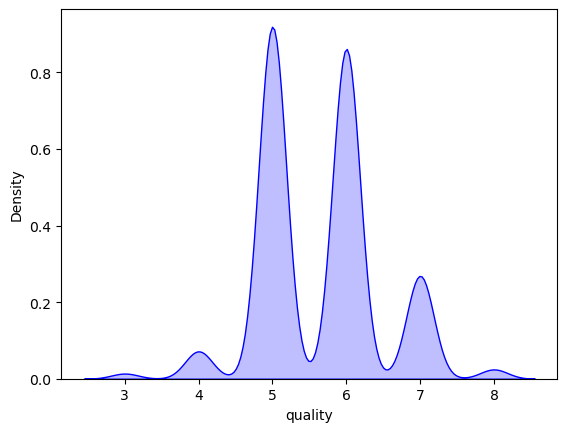

In [389]:
sns.distplot(winequalitydata['quality'],color="b", kde_kws={"shade":True}, hist=False)
plt.show()

In [ ]:
We can see that almost normal distribution exists in the plot

Now let's start the process of data transformation by reshaping them into float values for rest of the correlation data

In [47]:
from sklearn.preprocessing import OrdinalEncoder
OE=OrdinalEncoder()
for i in winequalitydata.columns:
    if winequalitydata[i].dtypes=='int64':
        winequalitydata[i]=OE.fit_transform(winequalitydata[i].values.reshape(-1,1))
winequalitydata
        

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4,0.0
1,7.8,0.880,0.00,2.6,0.098,25.0,67.0,0.99680,3.20,0.68,9.8,0.0
2,7.8,0.760,0.04,2.3,0.092,15.0,54.0,0.99700,3.26,0.65,9.8,0.0
3,11.2,0.280,0.56,1.9,0.075,17.0,60.0,0.99800,3.16,0.58,9.8,0.0
4,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...
1594,6.2,0.600,0.08,2.0,0.090,32.0,44.0,0.99490,3.45,0.58,10.5,0.0
1595,5.9,0.550,0.10,2.2,0.062,39.0,51.0,0.99512,3.52,0.76,11.2,0.0
1596,6.3,0.510,0.13,2.3,0.076,29.0,40.0,0.99574,3.42,0.75,11.0,0.0
1597,5.9,0.645,0.12,2.0,0.075,32.0,44.0,0.99547,3.57,0.71,10.2,0.0


Now let's check the datatypes of our variables

In [641]:
winequalitydata.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1599 entries, 0 to 1598
Data columns (total 12 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   fixed acidity         1599 non-null   float64
 1   volatile acidity      1599 non-null   float64
 2   citric acid           1599 non-null   float64
 3   residual sugar        1599 non-null   float64
 4   chlorides             1599 non-null   float64
 5   free sulfur dioxide   1599 non-null   float64
 6   total sulfur dioxide  1599 non-null   float64
 7   density               1599 non-null   float64
 8   pH                    1599 non-null   float64
 9   sulphates             1599 non-null   float64
 10  alcohol               1599 non-null   float64
 11  quality               1599 non-null   float64
dtypes: float64(12)
memory usage: 150.0 KB


In [392]:
winequalitydata.describe()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
count,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000
mean,2.017049,0.527821,0.270976,1.337840,0.436584,2.397125,3.413073,0.996747,3.311113,0.864522,2.181953,2.636023
std,0.135981,0.179060,0.194801,0.179776,0.053722,0.535717,0.797571,0.001887,0.154386,0.066930,0.072724,0.807569
min,1.663103,0.120000,0.000000,0.965489,0.228943,1.000000,1.817121,0.990070,2.740000,0.691042,2.032793,0.000000
25%,1.921997,0.390000,0.090000,1.238562,0.412129,1.912931,2.802039,0.995600,3.210000,0.819321,2.117912,2.000000
50%,1.991632,0.520000,0.260000,1.300591,0.429084,2.410142,3.361975,0.996750,3.310000,0.852702,2.168703,3.000000
75%,2.095379,0.640000,0.420000,1.375069,0.448140,2.758924,3.957892,0.997835,3.400000,0.900411,2.230699,3.000000
max,2.514581,1.580000,1.000000,2.493315,0.848556,4.160168,6.611489,1.003690,4.010000,1.259921,2.460719,5.000000


Now let's get the correlation values of all variables inside the dataframe

In [393]:
correlation = winequalitydata.corr()
correlation

C:\Users\ACHU NARAYAN\AppData\Local\Temp\ipykernel_36132\3111094382.py:1: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  correlation = winequalitydata.corr()


,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
fixed acidity,1.000000,-0.254872,0.670553,0.154116,0.164063,-0.173739,-0.115392,0.673615,-0.699735,0.196146,-0.082908,0.118123
volatile acidity,-0.254872,1.000000,-0.552496,0.017826,0.094520,0.006006,0.076637,0.022026,0.234937,-0.289979,-0.201828,-0.390558
citric acid,0.670553,-0.552496,1.000000,0.165255,0.192801,-0.080850,0.009224,0.364947,-0.541904,0.327678,0.109388,0.226373
residual sugar,0.154116,0.017826,0.165255,1.000000,0.093468,0.119639,0.171429,0.401010,-0.091009,0.017832,0.070057,0.020657
chlorides,0.164063,0.094520,0.192801,0.093468,1.000000,-0.007952,0.068634,0.303230,-0.282776,0.287061,-0.281050,-0.161767
free sulfur dioxide,-0.173739,0.006006,-0.080850,0.119639,-0.007952,1.000000,0.757872,-0.036124,0.089701,0.054612,-0.079680,-0.051243
total sulfur dioxide,-0.115392,0.076637,0.009224,0.171429,0.068634,0.757872,1.000000,0.095461,-0.031335,0.044914,-0.232059,-0.180815
density,0.673615,0.022026,0.364947,0.401010,0.303230,-0.036124,0.095461,1.000000,-0.341699,0.161109,-0.492844,-0.174919
pH,-0.699735,0.234937,-0.541904,-0.091009,-0.282776,0.089701,-0.031335,-0.341699,1.000000,-0.168561,0.206050,-0.057731
sulphates,0.196146,-0.289979,0.327678,0.017832,0.287061,0.054612,0.044914,0.161109,-0.168561,1.000000,0.123558,0.292537


Let's get a heatmap of the correlations

C:\Users\ACHU NARAYAN\AppData\Local\Temp\ipykernel_36132\1236106044.py:2: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  sns.heatmap(winequalitydata.corr(), linewidths = 0.1, fmt = ".1g", linecolor= "blue", annot=True, cmap= "viridis")


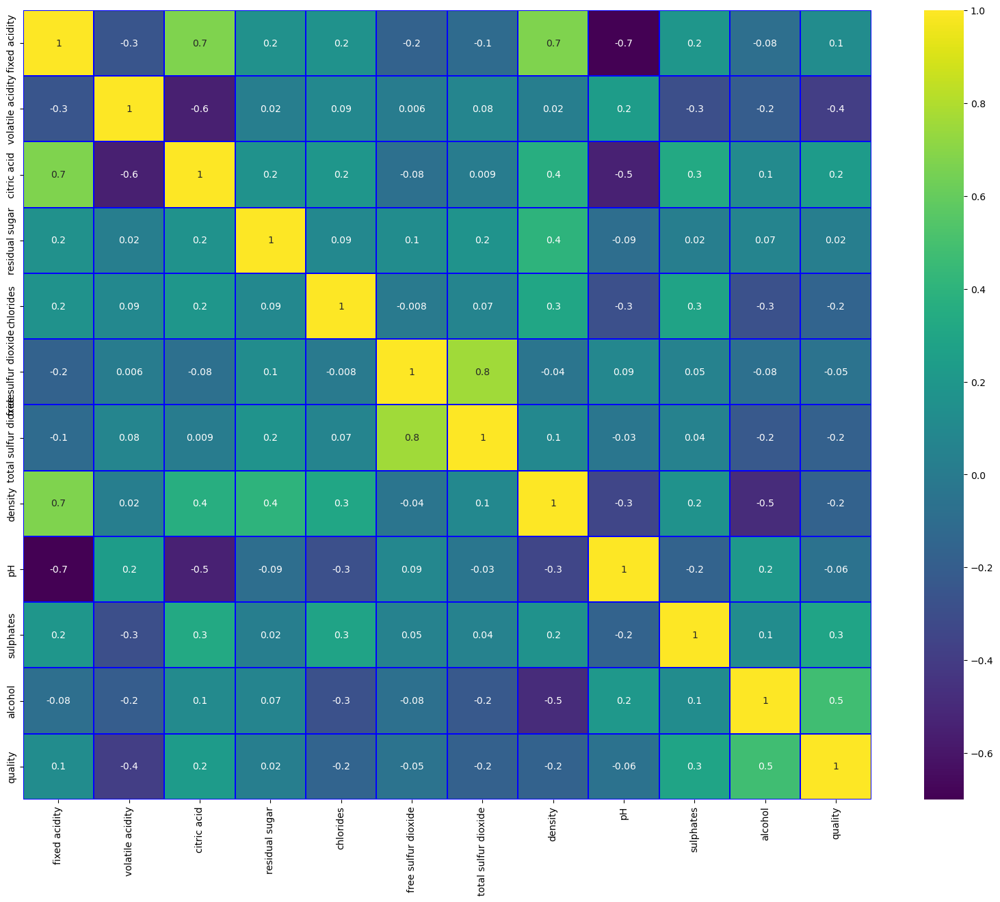

In [396]:
plt.figure(figsize = (20,15))
sns.heatmap(winequalitydata.corr(), linewidths = 0.1, fmt = ".1g", linecolor= "blue", annot=True, cmap= "viridis")
plt.yticks(rotation=90);
plt.show()

Following input and output variables are correlated when we did multivariate analysis-
quality and sulphates
quality and citric acid
quality and alcohol
quality and total sulfur dioxide
quality and volatile acidity
quality and density
quality and chlorides
fixed acidity and pH
fixed acidity and density
fixed acidity and volatile acidity
fixed acidity and citric acid
fixed acidity and residual 
fixed acidity and chlorides
fixed acidity and free sulfur dioxide
volatile acidity and citric acid
volatile acidity and pH
volatile acidity and sulphates
density and alcohol
pH and citric acid



In [642]:
correlation['quality'].sort_values(ascending = False)

quality                 1.000000
alcohol                 0.476928
sulphates               0.292537
citric acid             0.226373
fixed acidity           0.118123
residual sugar          0.020657
free sulfur dioxide    -0.051243
pH                     -0.057731
chlorides              -0.161767
density                -0.174919
total sulfur dioxide   -0.180815
volatile acidity       -0.390558
Name: quality, dtype: float64

Based on the correlations above and our previous analysis, we will feature select alcohol,sulphates,citric acid,chlorides,density, total sulfur dioxide and volatile acidity as new dataset.

Let's first scale the data before removing few columns- pH, free sulfur dioxide,residual sugar,fixed acidity

In [48]:
x = winequalitydata.drop("quality", axis=1)
y = winequalitydata["quality"]

In [49]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
x = pd.DataFrame(scaler.fit_transform(x), columns=x.columns)
x

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol
0,-0.528360,0.961877,-1.391472,-0.453218,-0.243707,-0.466193,-0.379133,0.558274,1.288643,-0.579207,-0.960246
1,-0.298547,1.967442,-1.391472,0.043416,0.223875,0.872638,0.624363,0.028261,-0.719933,0.128950,-0.584777
2,-0.298547,1.297065,-1.186070,-0.169427,0.096353,-0.083669,0.229047,0.134264,-0.331177,-0.048089,-0.584777
3,1.654856,-1.384443,1.484154,-0.453218,-0.264960,0.107592,0.411500,0.664277,-0.979104,-0.461180,-0.584777
4,-0.528360,0.961877,-1.391472,-0.453218,-0.243707,-0.466193,-0.379133,0.558274,1.288643,-0.579207,-0.960246
...,...,...,...,...,...,...,...,...,...,...,...
1594,-1.217796,0.403229,-0.980669,-0.382271,0.053845,1.542054,-0.075043,-0.978765,0.899886,-0.461180,0.072294
1595,-1.390155,0.123905,-0.877968,-0.240375,-0.541259,2.211469,0.137820,-0.862162,1.353436,0.601055,0.729364
1596,-1.160343,-0.099554,-0.723916,-0.169427,-0.243707,1.255161,-0.196679,-0.533554,0.705508,0.542042,0.541630
1597,-1.390155,0.654620,-0.775267,-0.382271,-0.264960,1.542054,-0.075043,-0.676657,1.677400,0.305990,-0.209308


Now let's check the VIF values

In [645]:
from statsmodels.stats.outliers_influence import variance_inflation_factor
vif = pd.DataFrame()
vif["VIF values"] = [variance_inflation_factor(x.values,i)
                     for i in range(len(x.columns))]
vif["Features"] = x.columns

vif


,VIF values,Features
0,7.767512,fixed acidity
1,1.789390,volatile acidity
2,3.128022,citric acid
3,1.702588,residual sugar
4,1.481932,chlorides
5,1.963019,free sulfur dioxide
6,2.186813,total sulfur dioxide
7,6.343760,density
8,3.329732,pH
9,1.429434,sulphates


Although not necessary but here is the PCA transformation if we had to fix the array

In [424]:
from sklearn.decomposition import PCA

n_components = 5
pca = PCA(n_components=n_components)
x_transformed = pca.fit_transform(x)

In [425]:
x_transformed

array([[-1.7300943 ,  1.28455564, -1.22411494,  0.00280203,  0.09738458],
       [-0.86027682,  2.2405178 ,  0.19855417,  0.30549533,  0.5315952 ],
       [-0.79718825,  1.58253715, -0.42938721,  0.31611846,  0.28280164],
       ...,
       [-1.42442654, -0.44869833,  1.39767991,  0.4121288 ,  0.57681267],
       [-2.45052293,  0.75006874,  0.98776393,  0.66351788,  0.43338533],
       [-0.37608367, -1.15698903,  1.48580057, -0.6443759 ,  0.22830681]])

Let's fix the VIF  values by-
removing 

fixed acidity, 
free sulfur dioxide, 
pH,
residual sugar. 

and keeping-

density
sulphates
citric acid
alcohol
total sulfur dioxide
volatile acidity

In [50]:
columns_with_low_corelation_and_high_VIF = ['fixed acidity','free sulfur dioxide', 'pH','residual sugar']
winequalitydata = winequalitydata.drop(columns=columns_with_low_corelation_and_high_VIF)

In [51]:
winequalitydata

,volatile acidity,citric acid,chlorides,total sulfur dioxide,density,sulphates,alcohol,quality
0,0.700,0.00,0.076,34.0,0.99780,0.56,9.4,0.0
1,0.880,0.00,0.098,67.0,0.99680,0.68,9.8,0.0
2,0.760,0.04,0.092,54.0,0.99700,0.65,9.8,0.0
3,0.280,0.56,0.075,60.0,0.99800,0.58,9.8,0.0
4,0.700,0.00,0.076,34.0,0.99780,0.56,9.4,0.0
...,...,...,...,...,...,...,...,...
1594,0.600,0.08,0.090,44.0,0.99490,0.58,10.5,0.0
1595,0.550,0.10,0.062,51.0,0.99512,0.76,11.2,0.0
1596,0.510,0.13,0.076,40.0,0.99574,0.75,11.0,0.0
1597,0.645,0.12,0.075,44.0,0.99547,0.71,10.2,0.0


In [52]:
x = winequalitydata.drop("quality", axis=1)
y = winequalitydata["quality"]

In [53]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
x = pd.DataFrame(scaler.fit_transform(x), columns=x.columns)
x

,volatile acidity,citric acid,chlorides,total sulfur dioxide,density,sulphates,alcohol
0,0.961877,-1.391472,-0.243707,-0.379133,0.558274,-0.579207,-0.960246
1,1.967442,-1.391472,0.223875,0.624363,0.028261,0.128950,-0.584777
2,1.297065,-1.186070,0.096353,0.229047,0.134264,-0.048089,-0.584777
3,-1.384443,1.484154,-0.264960,0.411500,0.664277,-0.461180,-0.584777
4,0.961877,-1.391472,-0.243707,-0.379133,0.558274,-0.579207,-0.960246
...,...,...,...,...,...,...,...
1594,0.403229,-0.980669,0.053845,-0.075043,-0.978765,-0.461180,0.072294
1595,0.123905,-0.877968,-0.541259,0.137820,-0.862162,0.601055,0.729364
1596,-0.099554,-0.723916,-0.243707,-0.196679,-0.533554,0.542042,0.541630
1597,0.654620,-0.775267,-0.264960,-0.075043,-0.676657,0.305990,-0.209308


In [54]:
from statsmodels.stats.outliers_influence import variance_inflation_factor
vif = pd.DataFrame()
vif["VIF values"] = [variance_inflation_factor(x.values,i)
                     for i in range(len(x.columns))]
vif["Features"] = x.columns

vif

,VIF values,Features
0,1.730017,volatile acidity
1,2.183075,citric acid
2,1.371672,chlorides
3,1.074968,total sulfur dioxide
4,1.912220,density
5,1.362801,sulphates
6,1.756582,alcohol


Now are VIF values are corrected. Now let's balance the dataset for applying the z-score transformation

In [55]:
y.value_counts()

0.0    1382
1.0     217
Name: quality, dtype: int64

In [56]:
from imblearn.over_sampling import SMOTE
SM = SMOTE()
x1,y1 = SM.fit_resample(x,y)

In [57]:
y.value_counts()

0.0    1382
1.0     217
Name: quality, dtype: int64

In [58]:
y1.value_counts()

0.0    1382
1.0    1382
Name: quality, dtype: int64

Now let's apply the z-score method to remove the outliers

In [76]:
from scipy.stats import zscore
out_features=winequalitydata[['volatile acidity','alcohol','sulphates','total sulfur dioxide','citric acid','density','chlorides']]
z=np.abs(zscore(out_features))
z

,volatile acidity,alcohol,sulphates,total sulfur dioxide,citric acid,density,chlorides
0,0.961877,0.960246,0.579207,0.379133,1.391472,0.558274,0.243707
1,1.967442,0.584777,0.128950,0.624363,1.391472,0.028261,0.223875
2,1.297065,0.584777,0.048089,0.229047,1.186070,0.134264,0.096353
3,1.384443,0.584777,0.461180,0.411500,1.484154,0.664277,0.264960
4,0.961877,0.960246,0.579207,0.379133,1.391472,0.558274,0.243707
...,...,...,...,...,...,...,...
1594,0.403229,0.072294,0.461180,0.075043,0.980669,0.978765,0.053845
1595,0.123905,0.729364,0.601055,0.137820,0.877968,0.862162,0.541259
1596,0.099554,0.541630,0.542042,0.196679,0.723916,0.533554,0.243707
1597,0.654620,0.209308,0.305990,0.075043,0.775267,0.676657,0.264960


In [77]:
np.where(z>3)

(array([  13,   15,   17,   17,   19,   38,   42,   43,   81,   81,   83,
          86,   88,   91,   92,  106,  106,  109,  120,  126,  127,  142,
         144,  147,  151,  151,  151,  169,  169,  181,  199,  226,  226,
         240,  258,  258,  281,  291,  339,  340,  354,  442,  451,  467,
         480,  515,  554,  555,  557,  568,  588,  591,  608,  614,  636,
         639,  649,  651,  652,  672,  672,  684,  690,  692,  692,  723,
         724,  730,  754,  776,  777,  795,  821,  836,  837,  889, 1017,
        1018, 1051, 1051, 1079, 1081, 1114, 1165, 1244, 1260, 1269, 1269,
        1270, 1270, 1288, 1289, 1299, 1312, 1319, 1319, 1367, 1370, 1370,
        1372, 1372, 1374, 1434, 1435, 1474, 1476, 1493, 1496, 1558, 1570],
       dtype=int64),
 array([2, 3, 2, 6, 6, 0, 6, 2, 2, 6, 6, 2, 2, 2, 2, 2, 6, 3, 0, 0, 0, 1,
        1, 6, 2, 4, 6, 2, 6, 6, 0, 2, 6, 6, 2, 6, 6, 6, 2, 2, 3, 5, 6, 1,
        5, 3, 5, 5, 5, 6, 1, 3, 5, 2, 3, 2, 3, 3, 1, 0, 3, 3, 0, 2, 6, 2,
        0, 6, 6,

In [78]:
winequalitydatanew=winequalitydata[(z<3).all(axis=1)]
winequalitydatanew.shape

(1505, 8)

In [79]:
data_loss_percentage = ((winequalitydata.shape[0] - winequalitydatanew.shape[0]) / winequalitydata.shape[0]) * 100
print("Data Loss Percentage:", data_loss_percentage)

Data Loss Percentage: 5.8786741713570985


In [80]:
winequalitydatanew.shape

(1505, 8)

Now the outliers are removed and the data loss percentage is not high for us to risk it in our predictions

Now let's balance the new dataset again

In [82]:
x = winequalitydatanew.drop("quality", axis=1)
y = winequalitydatanew["quality"]

In [83]:
y.value_counts()

0.0    1298
1.0     207
Name: quality, dtype: int64

In [84]:
from imblearn.over_sampling import SMOTE
SM = SMOTE()
x1,y1 = SM.fit_resample(x,y)

In [85]:
y1.value_counts()

0.0    1298
1.0    1298
Name: quality, dtype: int64

Let's check for the best accuracy score for the best random state

In [86]:
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score
maxaccuracy = 0
maxrandomstate = 0
for i in range(1,200):
      x_train,x_test,y_train,y_test = train_test_split(x1,y1, test_size = 0.30, random_state=i)
      RFC = RandomForestClassifier()
      RFC.fit(x_train,y_train)
pred=RFC.predict(x_test)
acc = accuracy_score(y_test, pred)
if acc>maxaccuracy:
    maxaccuracy=acc
    maxrandomstate=i
print("the best accuracy score",maxaccuracy,"at the following random state",maxrandomstate)

the best accuracy score 0.9255455712451861 at the following random state 199


Let's train the model for fullfilling the classification taska based on different classifiers

In [108]:
x_train,x_test,y_train,y_test = train_test_split(x1,y1, test_size = 0.30, random_state=maxrandomstate)

Import all the packages for classification

In [96]:
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.ensemble import RandomForestClassifier, ExtraTreesClassifier, GradientBoostingClassifier, AdaBoostClassifier, BaggingClassifier
from sklearn.svm import SVC
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, accuracy_score

In [62]:
RFC = RandomForestClassifier()
RFC.fit(x_train,y_train)
pred=RFC.predict(x_test)
print(accuracy_score(y_test, pred))
print(confusion_matrix(y_test,pred))
print(classification_report(y_test,pred))

0.9153400868306801
[[595  74]
 [ 43 670]]
              precision    recall  f1-score   support

           0       0.93      0.89      0.91       669
           1       0.90      0.94      0.92       713

    accuracy                           0.92      1382
   macro avg       0.92      0.91      0.92      1382
weighted avg       0.92      0.92      0.92      1382



In [65]:
LogReg = LogisticRegression()
LogReg.fit(x_train,y_train)
predLogReg=LogReg.predict(x_test)
print(accuracy_score(y_test, predLogReg))
print(confusion_matrix(y_test,predLogReg))
print(classification_report(y_test,predLogReg))

0.7952243125904487
[[534 135]
 [148 565]]
              precision    recall  f1-score   support

           0       0.78      0.80      0.79       669
           1       0.81      0.79      0.80       713

    accuracy                           0.80      1382
   macro avg       0.80      0.80      0.80      1382
weighted avg       0.80      0.80      0.80      1382



In [77]:
GradBoos = GradientBoostingClassifier()
GradBoos.fit(x_train,y_train)
predGradBoos=GradBoos.predict(x_test)
print(accuracy_score(y_test, predGradBoos))
print(confusion_matrix(y_test,predGradBoos))
print(classification_report(y_test,predGradBoos))

0.8806078147612156
[[570  99]
 [ 66 647]]
              precision    recall  f1-score   support

           0       0.90      0.85      0.87       669
           1       0.87      0.91      0.89       713

    accuracy                           0.88      1382
   macro avg       0.88      0.88      0.88      1382
weighted avg       0.88      0.88      0.88      1382



In [67]:
BagClass = BaggingClassifier()
BagClass.fit(x_train,y_train)
predBagClass=BagClass.predict(x_test)
print(accuracy_score(y_test, predBagClass))
print(confusion_matrix(y_test,predBagClass))
print(classification_report(y_test,predBagClass))

0.8994211287988423
[[596  73]
 [ 66 647]]
              precision    recall  f1-score   support

           0       0.90      0.89      0.90       669
           1       0.90      0.91      0.90       713

    accuracy                           0.90      1382
   macro avg       0.90      0.90      0.90      1382
weighted avg       0.90      0.90      0.90      1382



In [114]:
Extrees = ExtraTreesClassifier()
Extrees.fit(x_train,y_train)
predExtrees=Extrees.predict(x_test)
print(accuracy_score(y_test, predExtrees))
print(confusion_matrix(y_test,predExtrees))
print(classification_report(y_test,predExtrees))

0.9319826338639653
[[601  68]
 [ 26 687]]
              precision    recall  f1-score   support

           0       0.96      0.90      0.93       669
           1       0.91      0.96      0.94       713

    accuracy                           0.93      1382
   macro avg       0.93      0.93      0.93      1382
weighted avg       0.93      0.93      0.93      1382



In [97]:
SVC = SVC()
SVC.fit(x_train,y_train)
predSVC=SVC.predict(x_test)
print(accuracy_score(y_test, predSVC))
print(confusion_matrix(y_test,predSVC))
print(classification_report(y_test,predSVC))

0.8625
[[413   0]
 [ 66   1]]
              precision    recall  f1-score   support

           0       0.86      1.00      0.93       413
           1       1.00      0.01      0.03        67

    accuracy                           0.86       480
   macro avg       0.93      0.51      0.48       480
weighted avg       0.88      0.86      0.80       480



In [103]:
AdaBoos = AdaBoostClassifier()
AdaBoos.fit(x_train,y_train)
Adapred=AdaBoos.predict(x_test)
print(accuracy_score(y_test, Adapred))
print(confusion_matrix(y_test,Adapred))
print(classification_report(y_test,Adapred))

0.8645833333333334
[[390  23]
 [ 42  25]]
              precision    recall  f1-score   support

           0       0.90      0.94      0.92       413
           1       0.52      0.37      0.43        67

    accuracy                           0.86       480
   macro avg       0.71      0.66      0.68       480
weighted avg       0.85      0.86      0.85       480



In [81]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error
x_train, x_test, y_train, y_test = train_test_split(x,y, test_size=0.30, random_state=42)
LogRegmodel = LogisticRegression()
LogRegmodel.fit(x_train, y_train)
true_values = y_test
predicted_values = LogRegmodel.predict(x_test)

In [82]:
predicted_values

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1,
       0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0,

R2 scores

In [84]:
from sklearn.metrics import r2_score
predicted_values = [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,0,0]
true_values = [0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 1,0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
r2 = r2_score(true_values, predicted_values)
print("R2 Score:", r2)

R2 Score: -0.09375


In [ ]:
Cross validation scores

In [87]:
X = x
y = y
classifier = ExtraTreesClassifier()
cross_val_scores = cross_val_score(classifier, x, y, cv=5, scoring='accuracy')
print("Cross-Validation Scores:", cross_val_scores)
print("Mean Score:", cross_val_scores.mean())
print("Standard Deviation:", cross_val_scores.std())

Cross-Validation Scores: [0.88125    0.85       0.875      0.871875   0.87774295]
Mean Score: 0.8711735893416929
Standard Deviation: 0.011028551935911068


In [88]:
X = x
y = y
classifier = BaggingClassifier()
cross_val_scores = cross_val_score(classifier, x, y, cv=5, scoring='accuracy')
print("Cross-Validation Scores:", cross_val_scores)
print("Mean Score:", cross_val_scores.mean())
print("Standard Deviation:", cross_val_scores.std())

Cross-Validation Scores: [0.884375   0.85       0.85625    0.85       0.85579937]
Mean Score: 0.8592848746081506
Standard Deviation: 0.012831924019572595


In [89]:
X = x
y = y
classifier = GradientBoostingClassifier()
cross_val_scores = cross_val_score(classifier, x, y, cv=5, scoring='accuracy')
print("Cross-Validation Scores:", cross_val_scores)
print("Mean Score:", cross_val_scores.mean())
print("Standard Deviation:", cross_val_scores.std())

Cross-Validation Scores: [0.871875   0.846875   0.86875    0.8375     0.85579937]
Mean Score: 0.8561598746081505
Standard Deviation: 0.012961529244075471


In [90]:
X = x
y = y
classifier = RandomForestClassifier()
cross_val_scores = cross_val_score(classifier, x, y, cv=5, scoring='accuracy')
print("Cross-Validation Scores:", cross_val_scores)
print("Mean Score:", cross_val_scores.mean())
print("Standard Deviation:", cross_val_scores.std())

Cross-Validation Scores: [0.896875   0.859375   0.884375   0.871875   0.88087774]
Mean Score: 0.8786755485893417
Standard Deviation: 0.012548402886300096


In [91]:
X = x
y = y
classifier = LogisticRegression()
cross_val_scores = cross_val_score(classifier, x, y, cv=5, scoring='r2')
print("Cross-Validation Scores:", cross_val_scores)
print("Mean Score:", cross_val_scores.mean())
print("Standard Deviation:", cross_val_scores.std())

Cross-Validation Scores: [-0.07463689 -0.23583242  0.13043478 -0.21212121 -0.04828109]
Mean Score: -0.08808736712081447
Standard Deviation: 0.1317045035445736


In [101]:
from sklearn.svm import SVC
X = x
y = y
classifier = SVC()
cross_val_scores = cross_val_score(classifier, x, y, cv=5, scoring='accuracy')
print("Cross-Validation Scores:", cross_val_scores)
print("Mean Score:", cross_val_scores.mean())
print("Standard Deviation:", cross_val_scores.std())

Cross-Validation Scores: [0.865625   0.865625   0.8625     0.8625     0.86520376]
Mean Score: 0.8642907523510971
Standard Deviation: 0.0014702113940265387


In [104]:
X = x
y = y
classifier = AdaBoostClassifier()
cross_val_scores = cross_val_score(classifier, x, y, cv=5, scoring='accuracy')
print("Cross-Validation Scores:", cross_val_scores)
print("Mean Score:", cross_val_scores.mean())
print("Standard Deviation:", cross_val_scores.std())

Cross-Validation Scores: [0.890625   0.84375    0.878125   0.828125   0.85579937]
Mean Score: 0.8592848746081504
Standard Deviation: 0.02263436599607075


In [ ]:
Hyperparameter tuning

In [126]:
from sklearn.model_selection import GridSearchCV

parameters = {'criterion':['gini','entropy'],'random_state':[10,50,1000], 'max_depth':[0,10,20], 'n_jobs':[-2,-1,1],'n_estimators':[50,100,200,300]}

In [127]:
GSCV=GridSearchCV(ExtraTreesClassifier(),parameters,cv=5)

In [128]:
GSCV.fit(x_train,y_train)

C:\ProgramData\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py:378: FitFailedWarning: 
360 fits failed out of a total of 1080.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
360 fits failed with the following error:
Traceback (most recent call last):
  File "C:\ProgramData\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py", line 686, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\ProgramData\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py", line 340, in fit
    self._validate_params()
  File "C:\ProgramData\anaconda3\Lib\site-packages\sklearn\base.py", line 600, in _validate_params
    validate_parameter_constraints(
  File "C:\ProgramData\anaconda3\Lib\site-pac

GridSearchCV(cv=5, estimator=ExtraTreesClassifier(),
             param_grid={'criterion': ['gini', 'entropy'],
                         'max_depth': [0, 10, 20],
                         'n_estimators': [50, 100, 200, 300],
                         'n_jobs': [-2, -1, 1],
                         'random_state': [10, 50, 1000]})

In [129]:
GSCV.best_params_

{'criterion': 'entropy',
 'max_depth': 20,
 'n_estimators': 300,
 'n_jobs': -2,
 'random_state': 1000}

Selected model- ExtraTrees Classifier- 0.9319826338639653 or 93.1% accuracy

In [130]:
Selected_model = ExtraTreesClassifier(criterion='entropy',max_depth=20, n_estimators=300,n_jobs=-2,random_state= 1000)
Selected_model.fit(x_train,y_train)
pred = Selected_model.predict(x_test)
accuracy= accuracy_score(y_test,pred)
print(accuracy*100)

93.05354558610709


ROC-AUC curve and predictions

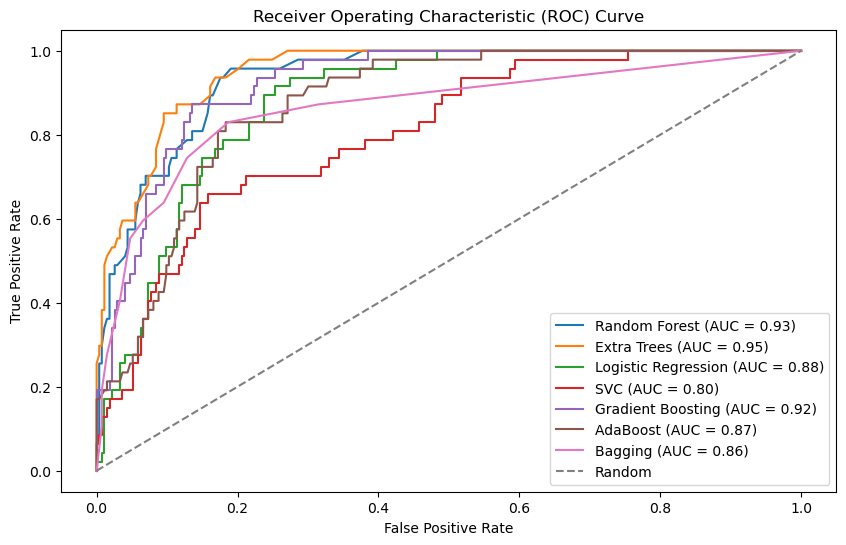

Random Forest: ROC AUC = 0.93
Extra Trees: ROC AUC = 0.95
Logistic Regression: ROC AUC = 0.88
SVC: ROC AUC = 0.80
Gradient Boosting: ROC AUC = 0.92
AdaBoost: ROC AUC = 0.87
Bagging: ROC AUC = 0.86


In [143]:
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, roc_auc_score
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier, ExtraTreesClassifier, GradientBoostingClassifier, AdaBoostClassifier, BaggingClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC

x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.2, random_state=42)


classifiers = [
    ("Random Forest", RandomForestClassifier()),
    ("Extra Trees", ExtraTreesClassifier()),
    ("Logistic Regression", LogisticRegression()),
    ("SVC", SVC(probability=True)),  
    ("Gradient Boosting", GradientBoostingClassifier()),
    ("AdaBoost", AdaBoostClassifier()),
    ("Bagging", BaggingClassifier())
]


roc_auc_scores = {}


plt.figure(figsize=(10, 6))
for classifiername, classifier in classifiers:
    classifier.fit(x_train, y_train)
    y_pred_probability = classifier.predict_proba(x_test)[:, 1]
    fpr, tpr, thresholds = roc_curve(y_test, y_pred_probability)
    roc_auc = roc_auc_score(y_test, y_pred_proba)
    roc_auc_scores[name] = roc_auc
    
    plt.plot(fpr, tpr, label=f'{name} (AUC = {roc_auc:.2f})')

plt.plot([0, 1], [0, 1], linestyle='--', color='gray', label='Random')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend()
plt.show()


for name, roc_auc in roc_auc_scores.items():
    print(f'{name}: ROC AUC = {roc_auc:.2f}')

In [ ]:
Saving the model

In [144]:
import joblib
joblib.dump(Selected_model,"Wine_Quality_Data_Analysis.pkl")

['Wine_Quality_Data_Analysis.pkl']

In [ ]:
Loading the model

In [145]:
model = joblib.load("Wine_Quality_Data_Analysis.pkl")
prediction = model.predict(x_test)
prediction

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0,
       0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1,
       1, 0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 0,
       0, 1, 1, 0, 0, 1, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       1, 0, 0, 1, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0,
       0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0,
       1, 0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0,
       0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0,

In [ ]:
Final prediction

In [146]:
finaldata = np.array(y_test)
winerating = pd.DataFrame()
winerating["ourprediction"] = prediction
winerating["originalvalues"] = finaldata
winerating

,ourprediction,originalvalues
0,0,0
1,0,0
2,0,0
3,0,0
4,0,0
...,...,...
315,0,0
316,0,0
317,0,0
318,1,0
